# **Correlation analysis of the sensitivity values**

## Navigation

- [**Basic imports and initialization**](#Basic-imports-and-initialization)
- [**1. Alexnet**](#1.-Alexnet)
- [**2. ResNet18**](#2.-ResNet18)

## Basic imports and initialization

$\qquad$ [[Back to top]](#Navigation) $\qquad$ [[Next part $\to$]](#1.-Alexnet)

- [Limiting the hardware resources, importing packages](#Limiting-the-hardware-resources,-importing-packages)
- [Initializing common variables](#Initializing-common-variables)

In [1]:
notebook_directory_offset = '../'

### Limiting the hardware resources, importing packages

$\quad$[[Back to section]](#Basic-imports-and-initialization)$\quad$[[Next subsect.$\to$]](#Initializing-common-variables)

To provide easy access to modules stored in the ```../src/``` directory, we use the following workaround:

In [2]:
import os
import sys
sys.path.append(
    os.path.join(notebook_directory_offset, '../src/')
)

Next, we limit the hardware usage:

In [3]:
# set limitations on hardware
import hardware_setup
hardware_setup.mkl_set_num_threads(num_threads=1)

[mkl]: set up num_threads=1/4


Then we import all necessary packages:

In [4]:
import functools

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import correlation.su_visualize
import correlation.su_compute

import sensitivity_analysis.preprocess_visualize
import sensitivity_analysis.augmentation_setting

import preparation.single_unit
import preparation.utils

### Initializing common variables

[[$\leftarrow$Prev.subsect.]](#Limiting-the-hardware-resources,-importing-packages)$\quad$[[Back to section]](#Basic-imports-and-initialization)$\quad$

In [5]:
dataset_name = 'imagenet'
su_activations_dirname = '../results/single_unit/'
activations_dirname = '../results'
su_values_fnm_base = f'{dataset_name}_values_selected_single_units'
values_fnm_base = f'{dataset_name}_values'
augmentation_set_numbers_list = (1, 2)

extract_auxilliary_names = True

no_chan_name = 'original'

In [6]:
shpv_group_indices_dict = {}
for augmentation_set_number in augmentation_set_numbers_list:
    shpv_group_indices_dict[
        augmentation_set_number
    ] = sensitivity_analysis.augmentation_setting.get_group_variables_indices(
        augmentation_set_number,
        use_permutation_variable=extract_auxilliary_names,
        use_class_variable=extract_auxilliary_names,
        use_partition_variable=extract_auxilliary_names
    )

    
values_names_dict = {
    'shpv': ('shpv', ),
    'si': ('si', 'siT'),
}
ncols_orig = 8

chans_name_list = list(preparation.single_unit._HSVG_channel_names)
value_name_list = functools.reduce(
    lambda x, y: x+y, values_names_dict.values()
)

In [7]:
#corr_type = 'pearson'
#corr_type = 'spearman'

show = True
# plot_colorbar = True

#figsize_uw_means_cm_1 = (12, 12)
#figsize_uw_means_cm_2 = (14, 12)
figsize_uw_means_cm_1 = (10.5, 10.5)
figsize_uw_means_cm_2 = (10.5*7/6, 10.5)
figsize_hist_uw_means_cm = (12, 8)
figsize_corr_consolidated = (14, 10)
figsize_uw_means_diff_cm_1 = (10, 10)
figsize_uw_means_diff_cm_2 = (12, 10)
figsize_hist_uw_means_diff_cm = (12, 8)
figsize_corr_consolidated_diff = (14, 8)
#figsize_unit_cm_patterns = (7, 7)
figsize_unit_cm_patterns = (7, 5)
figsize_hist_uw_means_diff_cm_norm = (12, 8)
#figsize_uw_means_diff_cm_norm_orig_chan = (8, 8)
figsize_uw_means_diff_cm_norm_orig_chan = (8, 6)
figsize_hist_uw_means_diff_cm_norm_orig_chan = (12, 8)

cmap_uw_means_cm = 'RdBu_r'
color_cumul_uw_means_cm = 'burlywood'
color_bins_uw_means_cm = 'firebrick'
cmap_corr_consolidated = 'twilight'
cmap_uw_means_diff_cm = 'coolwarm'
color_cumul_uw_means_diff_cm = 'rosybrown'
color_bins_uw_means_diff_cm = 'firebrick'
cmap_unit_cm_patterns = 'bone_r'
color_cumul_hist_uw_means_diff_cm_norm = 'slategray'
color_bins_hist_uw_means_diff_cm_norm = 'firebrick'
cmap_uw_means_diff_cm_norm_orig_chan = 'gist_yarg'
color_cumul_hist_uw_means_diff_cm_norm_orig_chan = 'dimgray'
color_bins_hist_uw_means_diff_cm_norm_orig_chan = 'firebrick'

## 1. Alexnet

[[$\leftarrow$ Prev.part]](#Basic-imports-and-initialization) $\qquad$ [[Back to top]](#Navigation) $\qquad$ [[Next part $\to$]](#2.-ResNet18)


- [1.1 Setting up the configuration variables](#1.1-Setting-up-the-configuration-variables)
- [1.2 Correlation (space-wise) between pairs of augmentation variables](#1.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)
- [1.3 Mean absolute differences between (space-wise) correlation matrices (original and cut submodule)](#1.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))
- [1.4 Mean absolute norm between (space-wise) correlation matrices for pairs of layers](#1.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)
- [1.5 Correlation patterns extracted from correlation matrices for paired layers](#1.5-Correlation-patterns-extracted-from-correlation-matrices-for-paired-layers)
- [1.6 Mean absolute norm between (space-wise) original-channel differences of correlation matrices for pairs of layers](#1.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)
- [1.7 Correlation patterns extracted from original-channel correlation matrices for paired layers](#1.7-Correlation-patterns-extracted-from-original-channel-correlation-matrices-for-paired-layers)

### 1.1 Setting up the configuration variables

$\quad$ [[Back to section]](#1.-Alexnet)$\quad$[[Next subsect.$\to$]](#1.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)


In [8]:
alexnet_network_name = 'alexnet'
alexnet_network_modules = [
    'features.2', # Conv2d + ReLU + MaxPool2d
    'features.5', # ... + Conv2d + ReLU + MaxPool2d
    'features.7', # ... + Conv2d + ReLU
    'features.9', # ... + Conv2d + ReLU
    #'features.12', # ... + Conv2d + ReLU + MaxPool2d
    'avgpool', # ... + Conv2d + ReLU + MaxPool2d + AdaptiveAvgPool
    'classifier.2', # ... + Linear + ReLU
    'classifier.5', # ... + Linear + ReLU
    'classifier.6', # ... + Linear
]
alexnet_n_conv_modules = len(
    list(filter(lambda x: ('features' in x) or ('avgpool' in x), alexnet_network_modules))
)

alexnet_values_fnms_dict = preparation.single_unit.extract_massive_values_fnms(
    alexnet_network_name,
    values_fnm_base,
    augmentation_set_numbers_list,
    prefix=None
);

alexnet_hsv_values_fnms_dict = preparation.single_unit.extract_channeled_single_units_values_fnms(
    alexnet_network_name,
    su_values_fnm_base,
    augmentation_set_numbers_list,
    channels=preparation.single_unit._HSVG_channel_names,
)

alexnet_json_config_path = f'./{alexnet_network_name}_single_units.json' # no offset needed
alexnet_analysis_config_list = preparation.single_unit.load_config_from_json(alexnet_json_config_path)
alexnet_analysis_config_list = preparation.single_unit.extract_neuron_indices(alexnet_analysis_config_list)

In [ ]:
alexnet_results_hsv, alexnet_results_orig = preparation.utils.get_original_and_channeled_values(
    alexnet_hsv_values_fnms_dict,
    os.path.join(notebook_directory_offset, su_activations_dirname),
    alexnet_values_fnms_dict,
    os.path.join(notebook_directory_offset, activations_dirname),
    alexnet_analysis_config_list,
    alexnet_network_modules,
    values_names_dict,
    augmentation_set_numbers_list,
    shpv_group_indices_dict,
    extract_auxilliary_names=extract_auxilliary_names,
)

In [ ]:
alexnet_mean_cormat_hsv_dict = {}
alexnet_ci_lower_cormat_hsv_dict = {}
alexnet_ci_upper_cormat_hsv_dict = {}
alexnet_nanmask_cormat_hsv_dict = {}
alexnet_mean_cormat_orig_dict = {}
alexnet_ci_lower_cormat_orig_dict = {}
alexnet_ci_upper_cormat_orig_dict = {}
alexnet_nanmask_cormat_orig_dict = {}
alexnet_mean_cormat_diff = {}
alexnet_ci_lower_cormat_diff = {}
alexnet_ci_upper_cormat_diff = {}
alexnet_nanmask_cormat_diff = {}

for augmentation_set_number in augmentation_set_numbers_list:
    (
        (mean_cormat_hsv, ci_lower_cormat_hsv, ci_upper_cormat_hsv, nanmask_cormat_hsv),
        (mean_cormat_orig, ci_lower_cormat_orig, ci_upper_cormat_orig, nanmask_cormat_orig),
        (mean_cormat_diff, ci_lower_cormat_diff, ci_upper_cormat_diff, nanmask_cormat_diff),
    ) = correlation.su_compute.extract_unit_mean_pixelwise_correlation_patterns(
        alexnet_results_hsv,
        alexnet_results_orig,
        alexnet_network_modules,
        augmentation_set_number,
        chans_name_list,
        value_name_list,
        extract_auxilliary_names=extract_auxilliary_names,
        nan_mask_policy='all',
        ci_alpha=0.05,
        ci_n_bootstraps=1000,
        ci_random_state=9703,
    )
    alexnet_mean_cormat_hsv_dict[augmentation_set_number] = mean_cormat_hsv
    alexnet_ci_lower_cormat_hsv_dict[augmentation_set_number] = ci_lower_cormat_hsv
    alexnet_ci_upper_cormat_hsv_dict[augmentation_set_number] = ci_upper_cormat_hsv
    alexnet_nanmask_cormat_hsv_dict[augmentation_set_number] = nanmask_cormat_hsv
    alexnet_mean_cormat_orig_dict[augmentation_set_number] = mean_cormat_orig
    alexnet_ci_lower_cormat_orig_dict[augmentation_set_number] = ci_lower_cormat_orig
    alexnet_ci_upper_cormat_orig_dict[augmentation_set_number] = ci_upper_cormat_orig
    alexnet_nanmask_cormat_orig_dict[augmentation_set_number] = nanmask_cormat_orig
    alexnet_mean_cormat_diff[augmentation_set_number] = mean_cormat_diff
    alexnet_ci_lower_cormat_diff[augmentation_set_number] = ci_lower_cormat_diff
    alexnet_ci_upper_cormat_diff[augmentation_set_number] = ci_upper_cormat_diff
    alexnet_nanmask_cormat_diff[augmentation_set_number] = nanmask_cormat_diff

In [ ]:
alexnet_cm_mean_hsv_diff_dict = {}
alexnet_cm_ci_lower_hsv_diff_dict = {}
alexnet_cm_ci_upper_hsv_diff_dict = {}
alexnet_cm_corr_hsv_diff_dict = {}
alexnet_cm_corr_hsv_diff_nanmask_dict = {}
alexnet_cm_mean_hsv_orig_diff_dict = {}
alexnet_cm_ci_lower_hsv_orig_diff_dict = {}
alexnet_cm_ci_upper_hsv_orig_diff_dict = {}
alexnet_cm_corr_hsv_orig_diff_dict = {}
alexnet_cm_corr_hsv_orig_diff_nanmask_dict = {}
for augmentation_set_number in augmentation_set_numbers_list:
    (
        (
            alexnet_cm_mean_hsv_diff,
            alexnet_cm_ci_lower_hsv_diff,
            alexnet_cm_ci_upper_hsv_diff,
            alexnet_cm_corr_hsv_diff,
            alexnet_cm_corr_hsv_diff_nanmask,
        ),
        (
            alexnet_cm_mean_hsv_orig_diff,
            alexnet_cm_ci_lower_hsv_orig_diff,
            alexnet_cm_ci_upper_hsv_orig_diff,
            alexnet_cm_corr_hsv_orig_diff,
            alexnet_cm_corr_hsv_orig_diff_nanmask,
        ),
    ) = correlation.su_compute.extract_hsv_correlation_layerwise_diff_patterns(
        alexnet_mean_cormat_hsv_dict[augmentation_set_number],
        alexnet_mean_cormat_orig_dict[augmentation_set_number],
        alexnet_network_modules[:alexnet_n_conv_modules],
        augmentation_set_number,
        chans_name_list,
        value_name_list,
        extract_auxilliary_names=extract_auxilliary_names,
        ci_alpha=0.05,
        ci_n_bootstraps=1000,
        ci_random_state=3387,
    )
    alexnet_cm_mean_hsv_diff_dict[augmentation_set_number] = alexnet_cm_mean_hsv_diff
    alexnet_cm_ci_lower_hsv_diff_dict[augmentation_set_number] = alexnet_cm_ci_lower_hsv_diff
    alexnet_cm_ci_upper_hsv_diff_dict[augmentation_set_number] = alexnet_cm_ci_upper_hsv_diff
    alexnet_cm_corr_hsv_diff_dict[augmentation_set_number] = alexnet_cm_corr_hsv_diff
    alexnet_cm_corr_hsv_diff_nanmask_dict[augmentation_set_number] = alexnet_cm_corr_hsv_diff_nanmask
    alexnet_cm_mean_hsv_orig_diff_dict[augmentation_set_number] = alexnet_cm_mean_hsv_orig_diff
    alexnet_cm_ci_lower_hsv_orig_diff_dict[augmentation_set_number] = alexnet_cm_ci_lower_hsv_orig_diff
    alexnet_cm_ci_upper_hsv_orig_diff_dict[augmentation_set_number] = alexnet_cm_ci_upper_hsv_orig_diff
    alexnet_cm_corr_hsv_orig_diff_dict[augmentation_set_number] = alexnet_cm_corr_hsv_orig_diff
    alexnet_cm_corr_hsv_orig_diff_nanmask_dict[augmentation_set_number] = alexnet_cm_corr_hsv_orig_diff_nanmask

### 1.2 Correlation (space-wise) between pairs of augmentation variables

[[$\leftarrow$Prev.subsect.]](#1.1-Setting-up-the-configuration-variables)$\quad$[[Back to section]](#1.-Alexnet)$\quad$[[Next subsect.$\to$]](#1.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))

- [1.2.1 Unit-wise means](#1.2.1-Unit-wise-means)
- [1.2.2 Consolidated summary plots](#1.2.2-Consolidated-summary-plots)
- [1.2.3 Widths of confidence intervals](#1.2.3-Widths-of-confidence-intervals)

### 1.2.1 Unit-wise means

- [1.2.1.1 Augmentation set 1](#1.2.1.2-Augmentation-set-1)
- [1.2.1.2 Augmentation set 2](#1.2.1.2-Augmentation-set-2)

[[Back to subsection]](#1.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)

#### 1.2.1.1 Augmentation set 1

[[Return back]](#1.2.1-Unit-wise-means)

In [13]:
notebook_directory_offset = '../'


			features.2


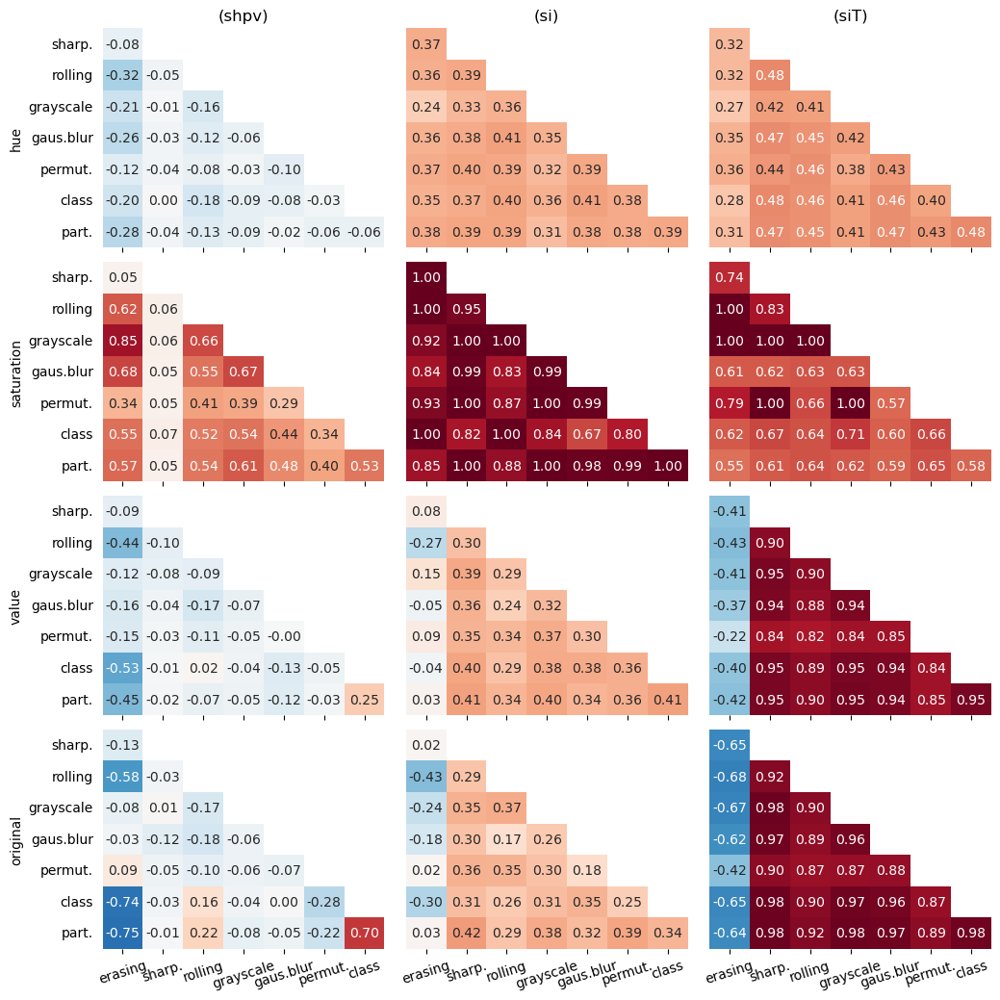


			features.5


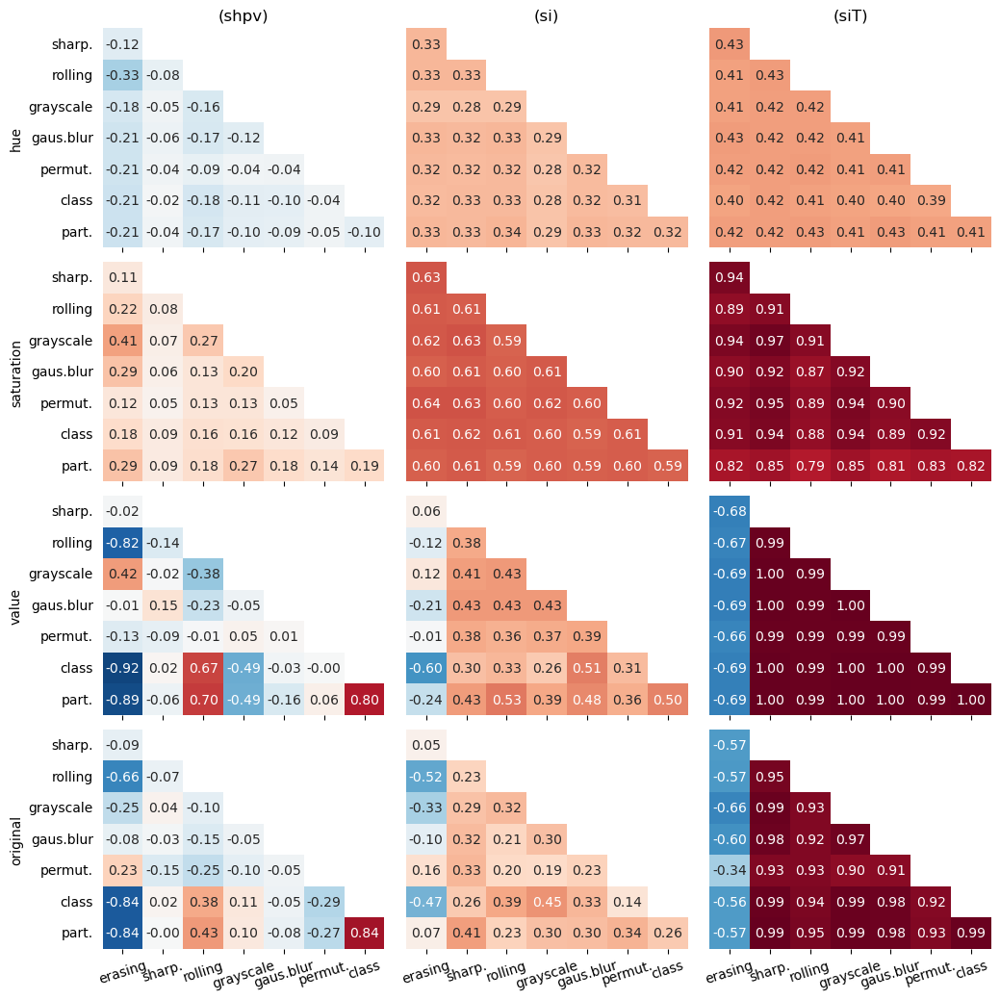


			features.7


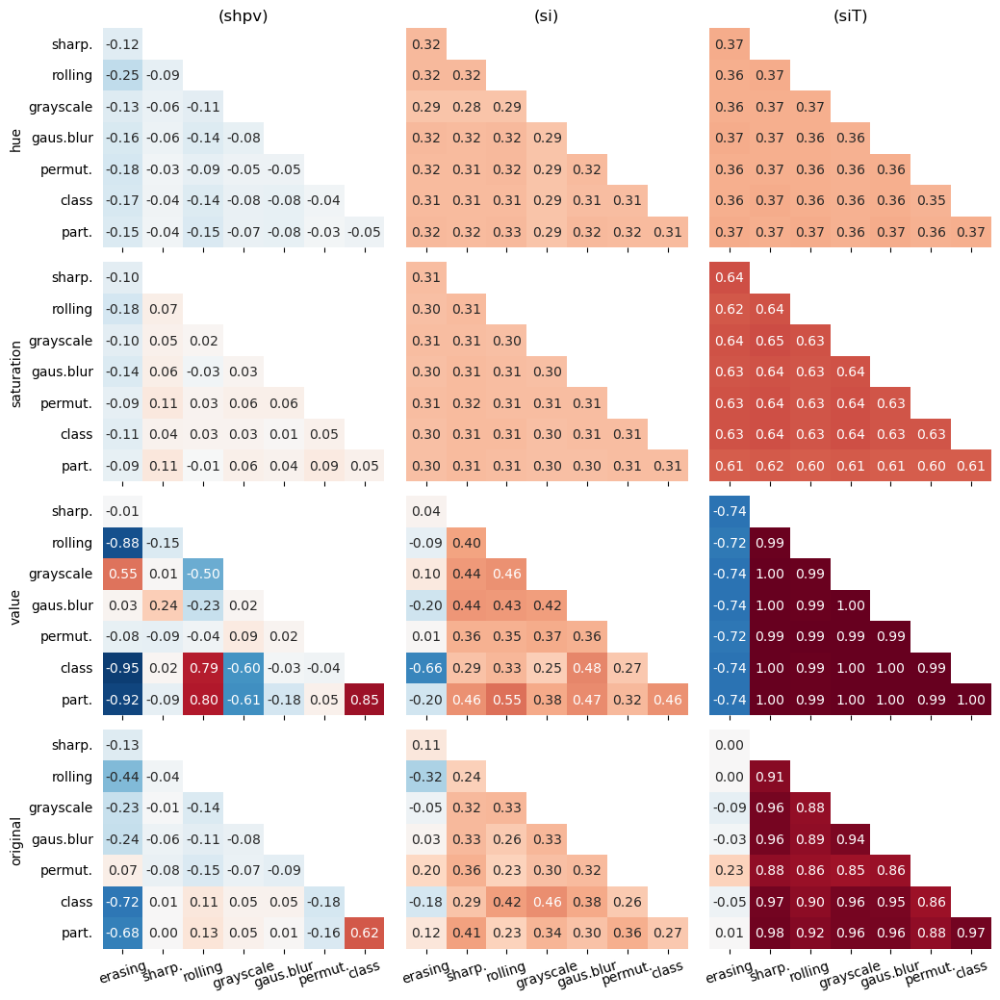


			features.9


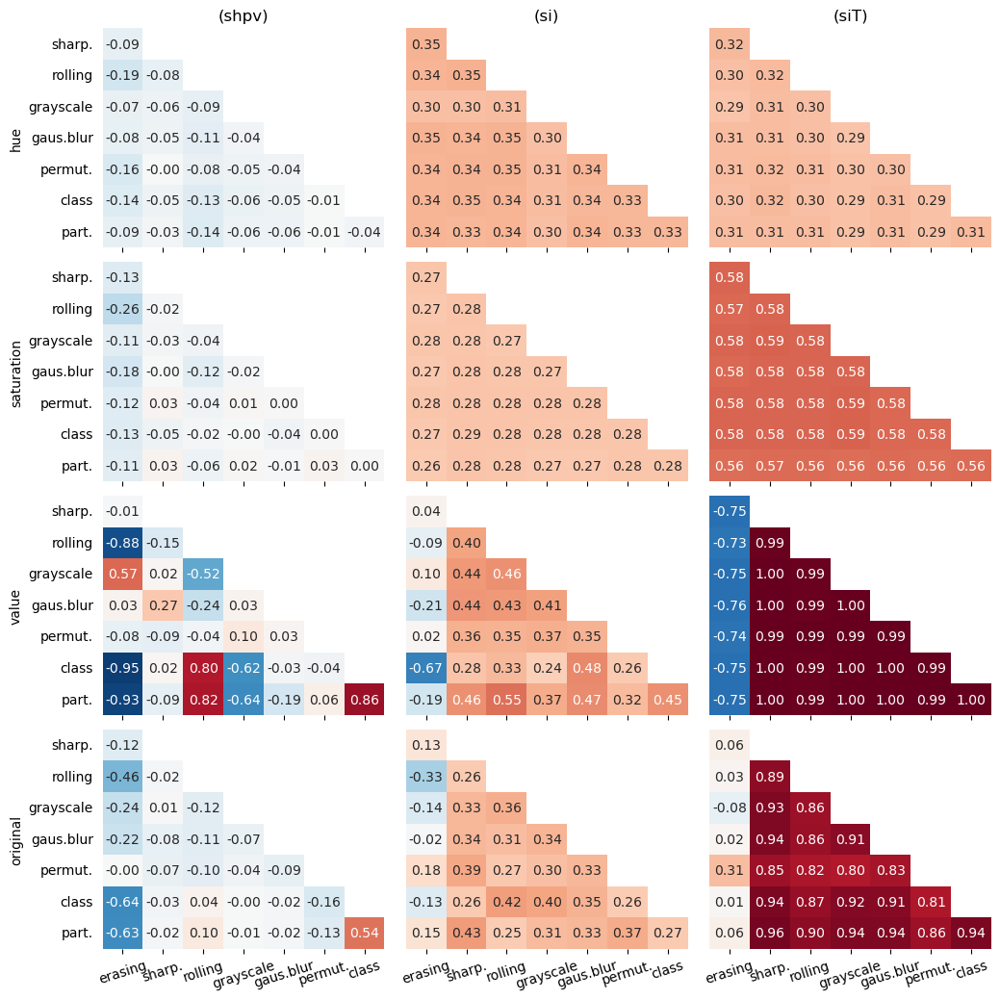


			avgpool


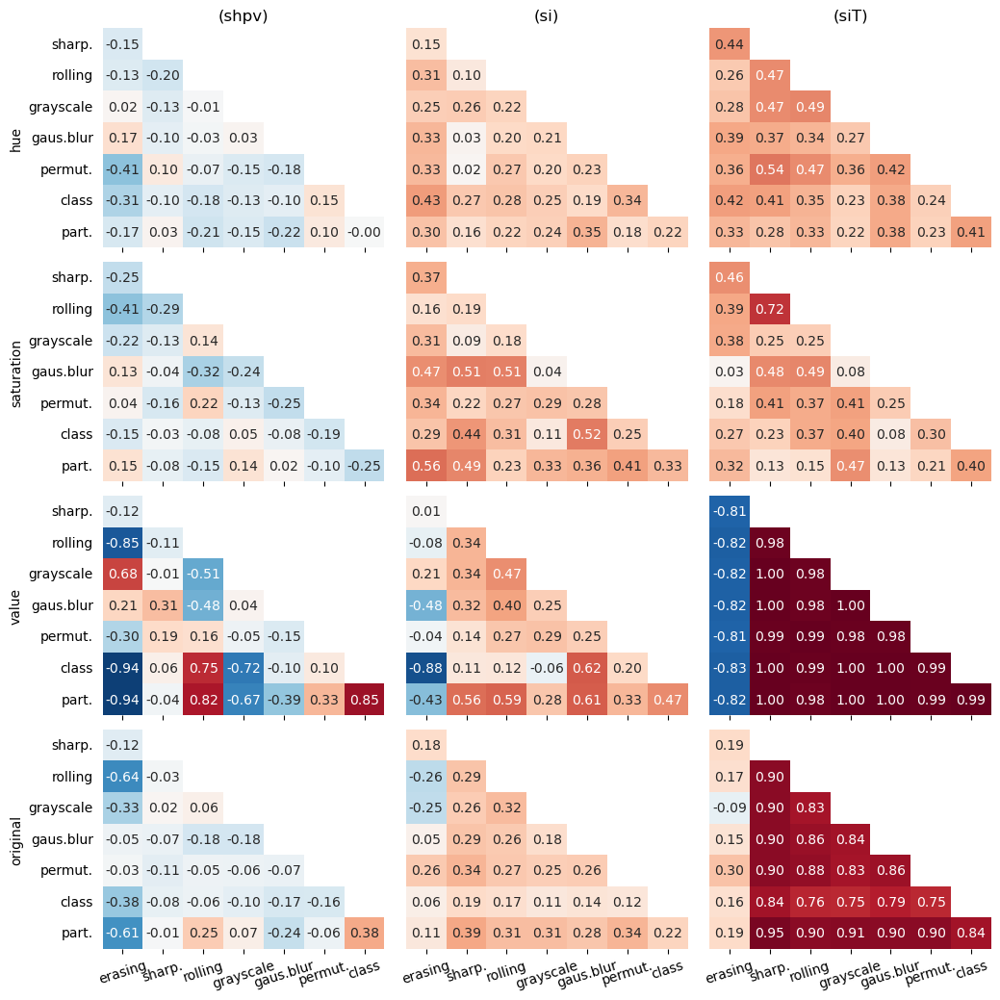

In [14]:
augmentation_set_number = 1

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{alexnet_network_name}_{dataset_name}/unit_mean_pixelwise_corpat/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'unit_mean_pixelwise_corpat_aug={augmentation_set_number}'


correlation.su_visualize.unit_mean_pixelwise_correlation_patterns(
    alexnet_mean_cormat_hsv_dict[augmentation_set_number],
    alexnet_mean_cormat_orig_dict[augmentation_set_number],
    alexnet_network_modules,
    augmentation_set_number,
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    cmap=cmap_uw_means_cm,
    figsize=figsize_uw_means_cm_1,
    show=True,
    no_chan_name=no_chan_name,
    save_dirname=save_dirname,
    save_filename_base=save_filename_base,
)

#### 1.2.1.2 Augmentation set 2

[[Return back]](#1.2.1-Unit-wise-means)


			features.2


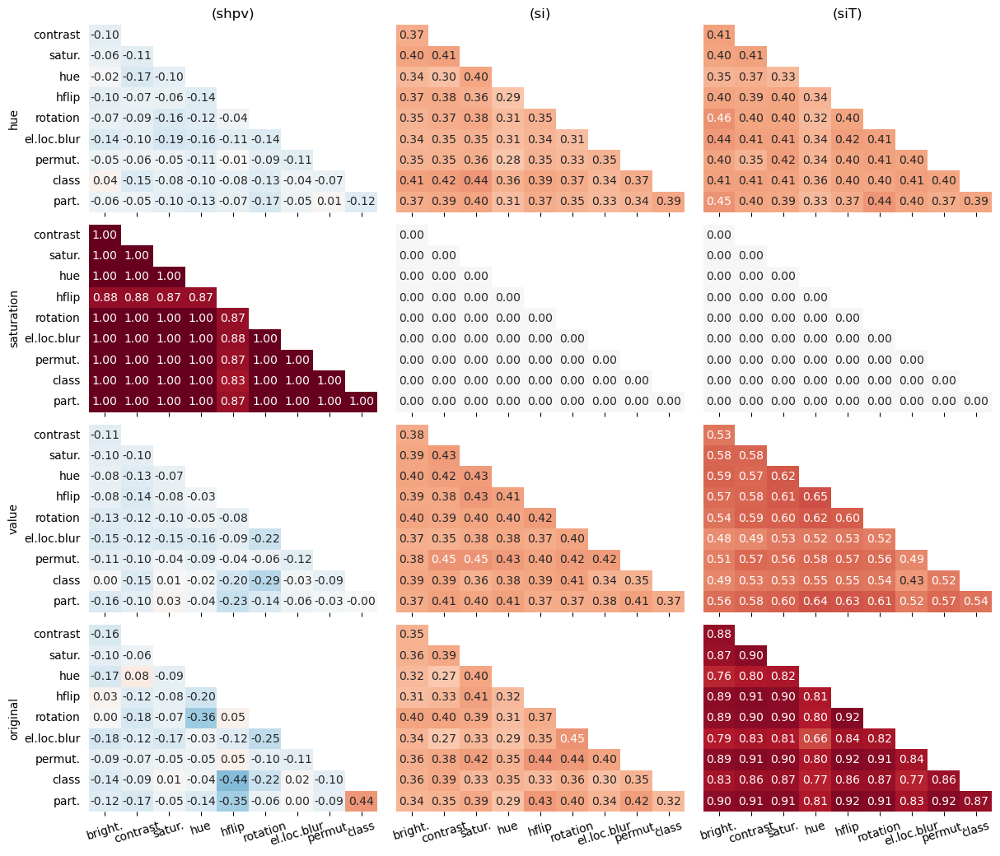


			features.5


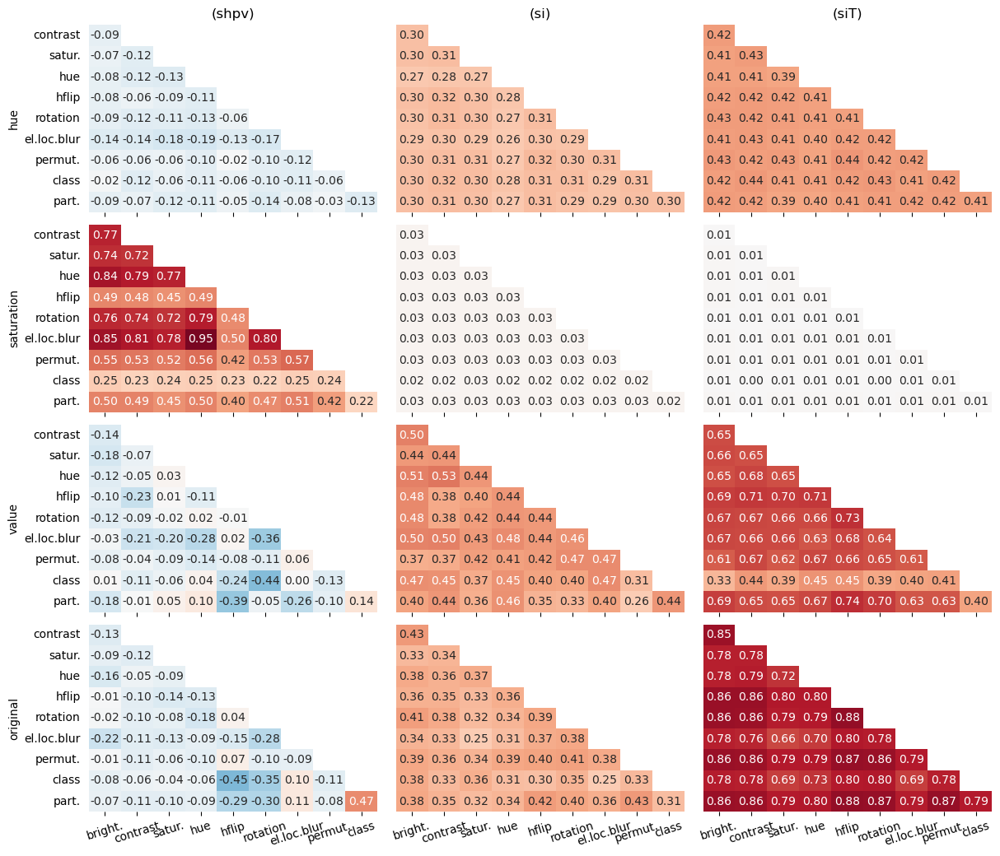


			features.7


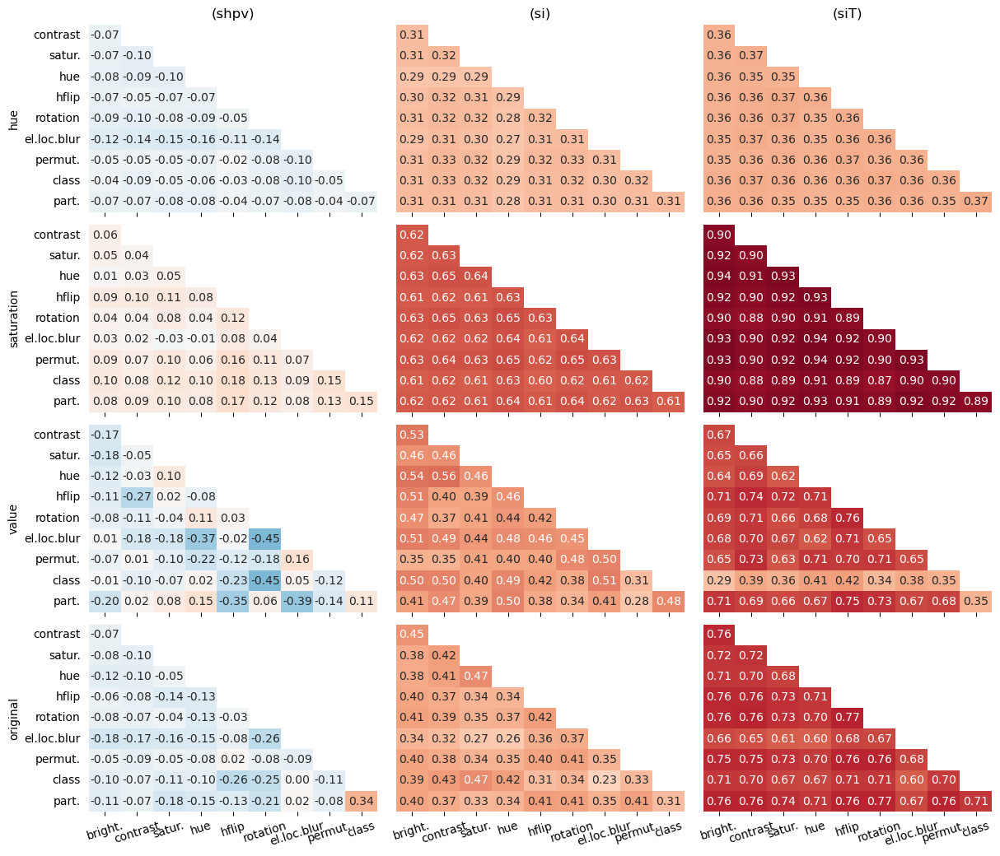


			features.9


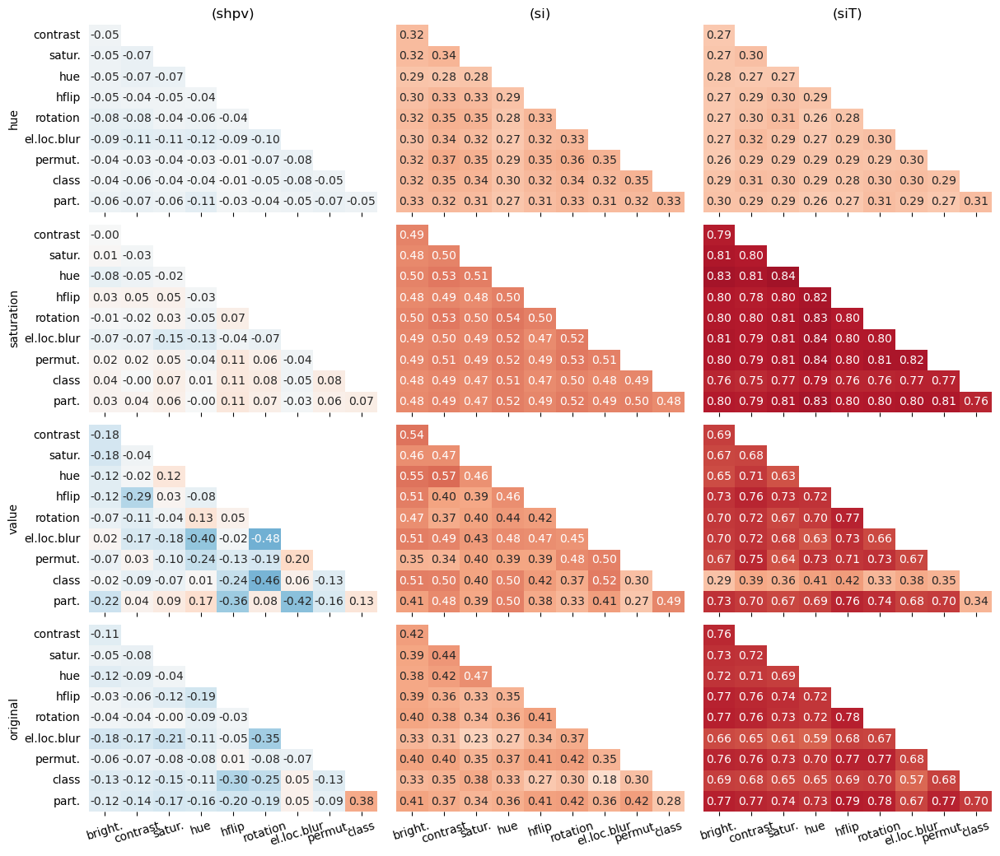


			avgpool


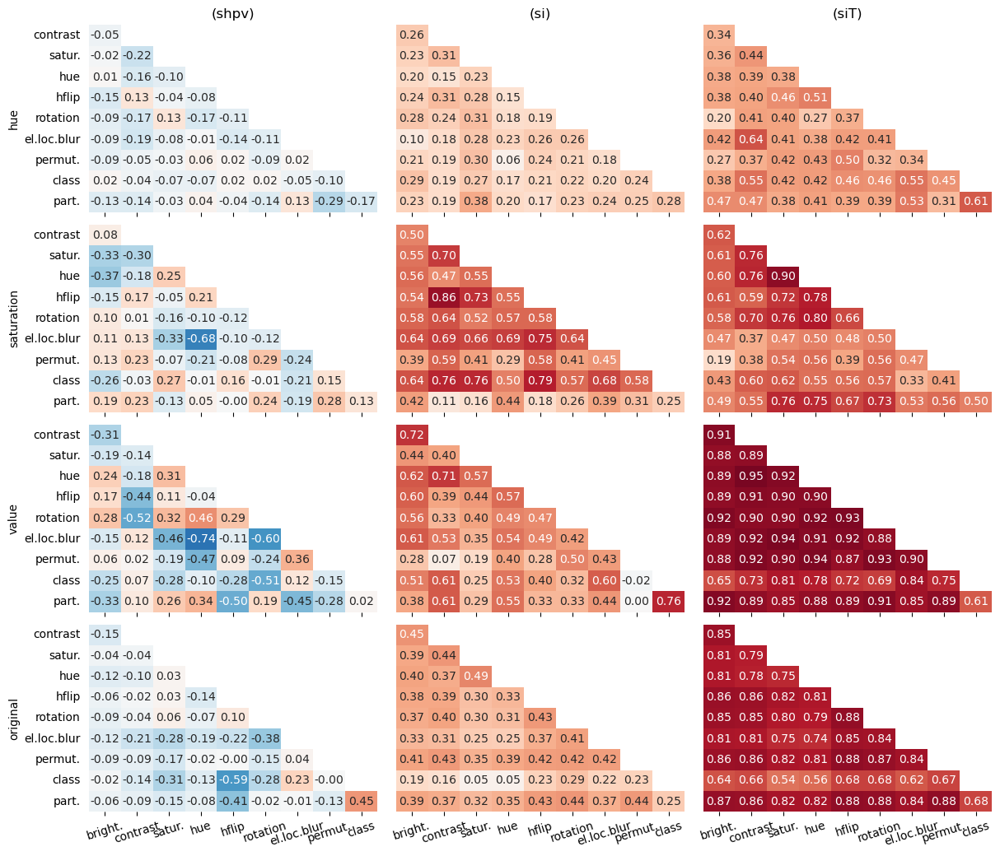

In [15]:
augmentation_set_number = 2

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{alexnet_network_name}_{dataset_name}/unit_mean_pixelwise_corpat/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'unit_mean_pixelwise_corpat_aug={augmentation_set_number}'


correlation.su_visualize.unit_mean_pixelwise_correlation_patterns(
    alexnet_mean_cormat_hsv_dict[augmentation_set_number],
    alexnet_mean_cormat_orig_dict[augmentation_set_number],
    alexnet_network_modules,
    augmentation_set_number,
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    cmap=cmap_uw_means_cm,
    figsize=figsize_uw_means_cm_2,
    show=True,
    no_chan_name=no_chan_name,
    save_dirname=save_dirname,
    save_filename_base=save_filename_base,
)

### 1.2.2 Consolidated summary plots

- [1.2.2.1 Augmentation set 1](#1.2.2.1-Augmentation-set-1)
- [1.2.2.2 Augmentation set 2](#1.2.2.2-Augmentation-set-2)

[[Back to subsection]](#1.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)

#### 1.2.2.1 Augmentation set 1

[[Return back]](#1.2.2-Consolidated-summary-plots)

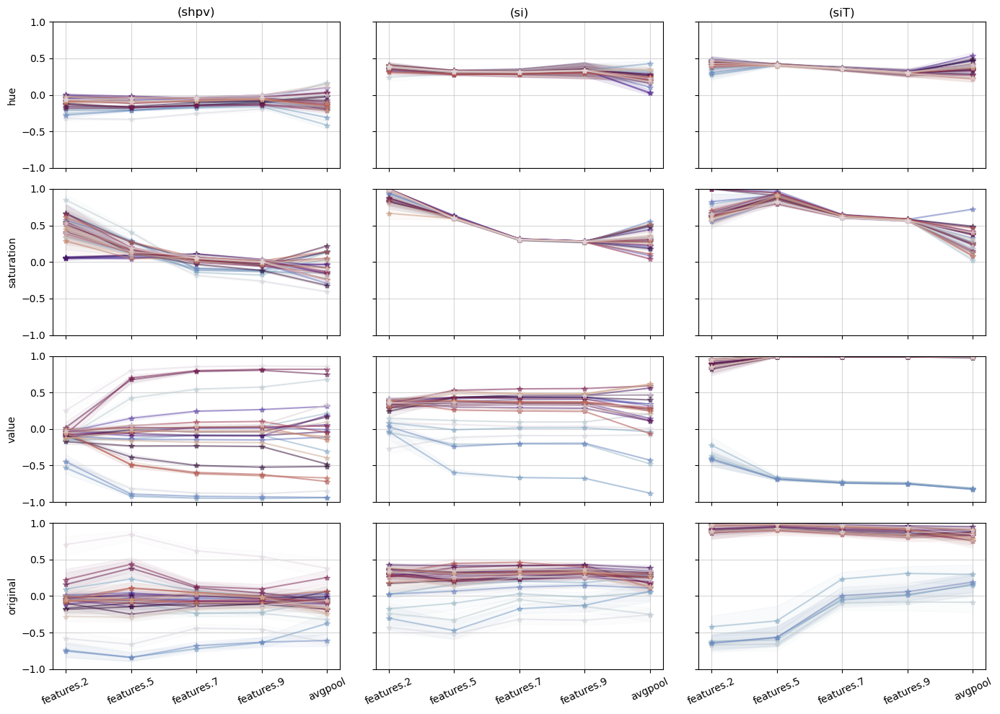

In [16]:
augmentation_set_number = 1

correlation.su_visualize.plot_consolidated_paired_correlations_fixed_values(
    alexnet_mean_cormat_hsv_dict[augmentation_set_number],
    alexnet_ci_lower_cormat_hsv_dict[augmentation_set_number],
    alexnet_ci_upper_cormat_hsv_dict[augmentation_set_number],
    alexnet_mean_cormat_orig_dict[augmentation_set_number],
    alexnet_ci_lower_cormat_orig_dict[augmentation_set_number],
    alexnet_ci_upper_cormat_orig_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    figsize=figsize_corr_consolidated,
    show=True,
    cmap=cmap_corr_consolidated,
    no_chan_name=no_chan_name,
)

#### 1.2.2.2 Augmentation set 2

[[Return back]](#1.2.2-Consolidated-summary-plots)

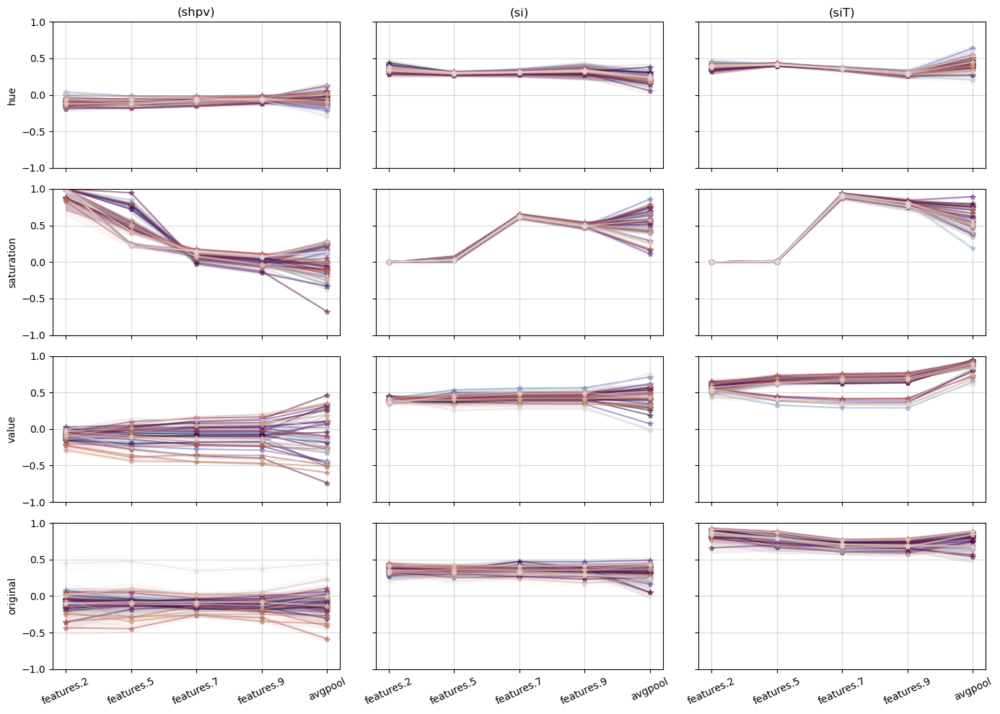

In [17]:
augmentation_set_number = 2

correlation.su_visualize.plot_consolidated_paired_correlations_fixed_values(
    alexnet_mean_cormat_hsv_dict[augmentation_set_number],
    alexnet_ci_lower_cormat_hsv_dict[augmentation_set_number],
    alexnet_ci_upper_cormat_hsv_dict[augmentation_set_number],
    alexnet_mean_cormat_orig_dict[augmentation_set_number],
    alexnet_ci_lower_cormat_orig_dict[augmentation_set_number],
    alexnet_ci_upper_cormat_orig_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    figsize=figsize_corr_consolidated,
    show=True,
    cmap=cmap_corr_consolidated,
    no_chan_name=no_chan_name,
)

### 1.2.3 Widths of confidence intervals

[[Back to subsection]](#1.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)

In [20]:
correlation.su_visualize.print_ci_interval_widths_cormat_hsv(
    alexnet_mean_cormat_hsv_dict,
    alexnet_ci_lower_cormat_hsv_dict,
    alexnet_ci_upper_cormat_hsv_dict,
    alexnet_network_modules,
    chans_name_list,
    value_name_list,
    augmentation_set_numbers_list,
    alexnet_n_conv_modules,
    extract_auxilliary_names=True
)

aug=1, features.2, hue, shpv:  0.032926839 <= delta <= 0.077421833
aug=1, features.2, hue, si:  0.073392698 <= delta <= 0.104903853
aug=1, features.2, hue, siT:  0.081849016 <= delta <= 0.128667944
aug=1, features.2, saturation, shpv:  0.036351628 <= delta <= 0.380529130
aug=1, features.2, saturation, si:  0.075086671 <= delta <= 0.246588303
aug=1, features.2, saturation, siT:  0.117077809 <= delta <= 0.308148280
aug=1, features.2, value, shpv:  0.038022343 <= delta <= 0.210953763
aug=1, features.2, value, si:  0.029457902 <= delta <= 0.190505905
aug=1, features.2, value, siT:  0.054653871 <= delta <= 0.227421056
aug=1, features.5, hue, shpv:  0.008474603 <= delta <= 0.022707864
aug=1, features.5, hue, si:  0.021392274 <= delta <= 0.030794611
aug=1, features.5, hue, siT:  0.007167077 <= delta <= 0.013492672
aug=1, features.5, saturation, shpv:  0.007710486 <= delta <= 0.076098127
aug=1, features.5, saturation, si:  0.020031409 <= delta <= 0.024267820
aug=1, features.5, saturation, siT:

In [21]:
correlation.su_visualize.print_ci_interval_widths_cormat_orig(
    alexnet_mean_cormat_orig_dict,
    alexnet_ci_lower_cormat_orig_dict,
    alexnet_ci_upper_cormat_orig_dict,
    alexnet_network_modules,
    value_name_list,
    augmentation_set_numbers_list,
    alexnet_n_conv_modules,
    extract_auxilliary_names=True
)

aug=1, features.2, original, shpv:  0.083035970 <= delta <= 0.312034295
aug=1, features.2, original, si:  0.046195748 <= delta <= 0.325860425
aug=1, features.2, original, siT:  0.024945866 <= delta <= 0.282047892
aug=1, features.5, original, shpv:  0.081927949 <= delta <= 0.227002419
aug=1, features.5, original, si:  0.051790620 <= delta <= 0.241804895
aug=1, features.5, original, siT:  0.007456770 <= delta <= 0.370098737
aug=1, features.7, original, shpv:  0.041731721 <= delta <= 0.152285886
aug=1, features.7, original, si:  0.032488417 <= delta <= 0.141765177
aug=1, features.7, original, siT:  0.016291055 <= delta <= 0.231368392
aug=1, features.9, original, shpv:  0.051767014 <= delta <= 0.156369489
aug=1, features.9, original, si:  0.030209042 <= delta <= 0.194849100
aug=1, features.9, original, siT:  0.029178402 <= delta <= 0.244528228
aug=1, avgpool, original, shpv:  0.097580792 <= delta <= 0.281371824
aug=1, avgpool, original, si:  0.077108265 <= delta <= 0.280427393
aug=1, avgpo

### 1.3 Mean absolute differences between (space-wise) correlation matrices (original and cut submodule)

[[$\leftarrow$Prev.subsect.]](#1.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)$\quad$[[Back to section]](#1.-Alexnet)$\quad$[[Next subsect.$\to$]](#1.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)

- [1.3.1 Unit-wise means](#1.3.1-Unit-wise-means)
- [1.3.2 Consolidated summary plots](#1.3.2-Consolidated-summary-plots)
- [1.3.3 Widths of confidence intervals](#1.3.3-Widths-of-confidence-intervals)

### 1.3.1 Unit-wise means

- [1.3.1.1 Augmentation set 1](#1.3.1.2-Augmentation-set-1)
- [1.3.1.2 Augmentation set 2](#1.3.1.2-Augmentation-set-2)

[[Back to subsection]](#1.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))

#### 1.3.1.1 Augmentation set 1

[[Return back]](#1.3.1-Unit-wise-means)


			features.2


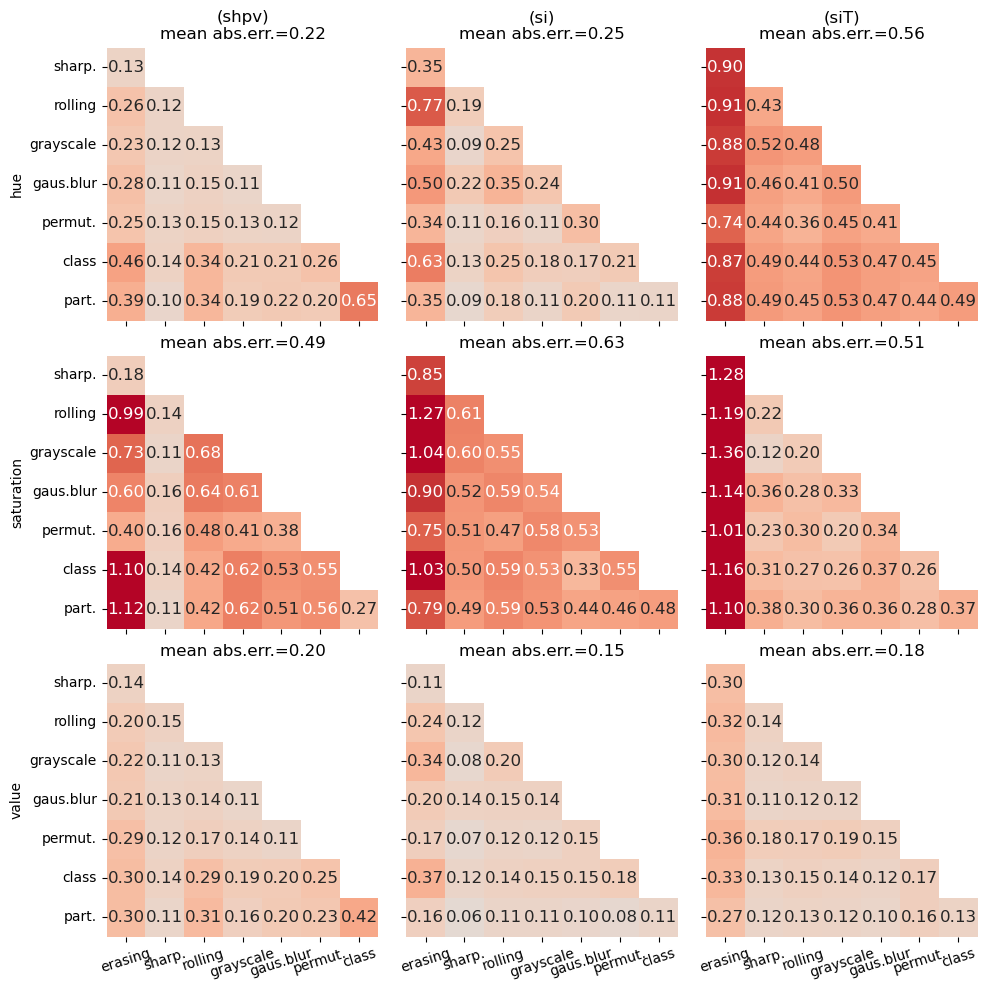


			features.5


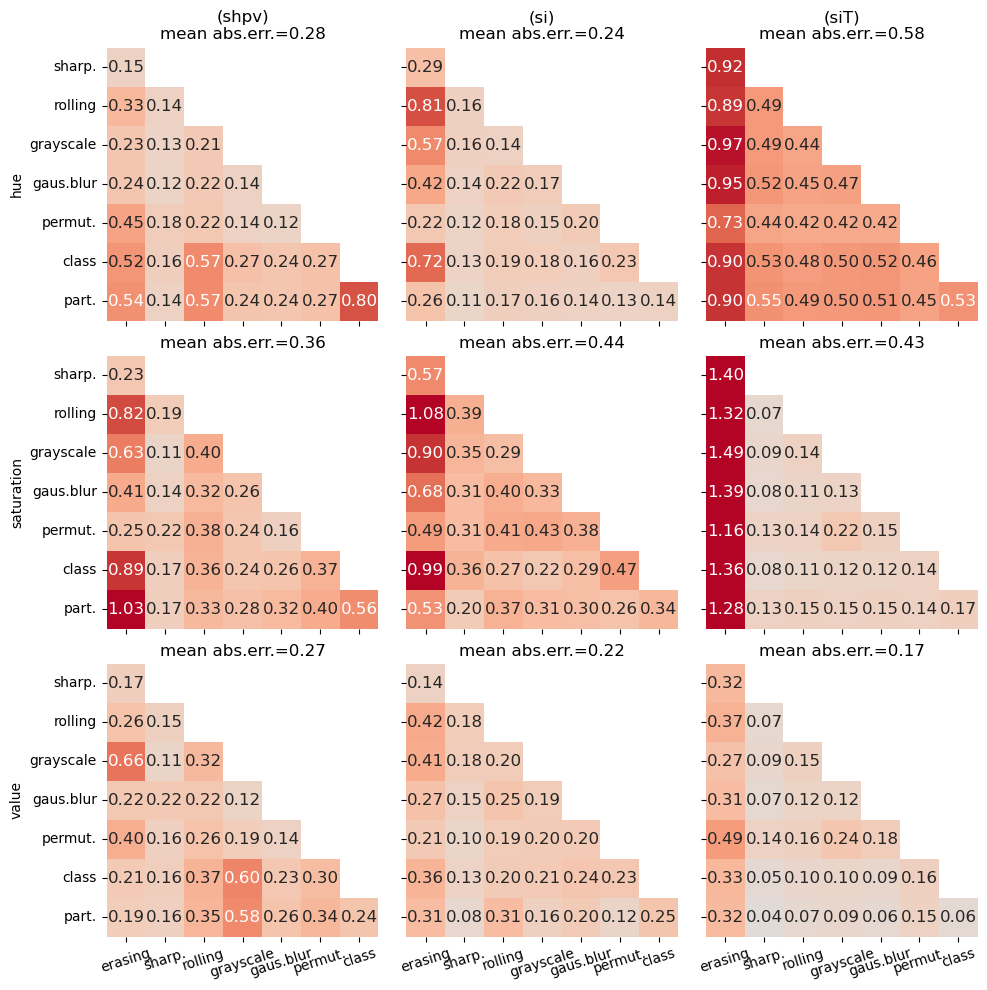


			features.7


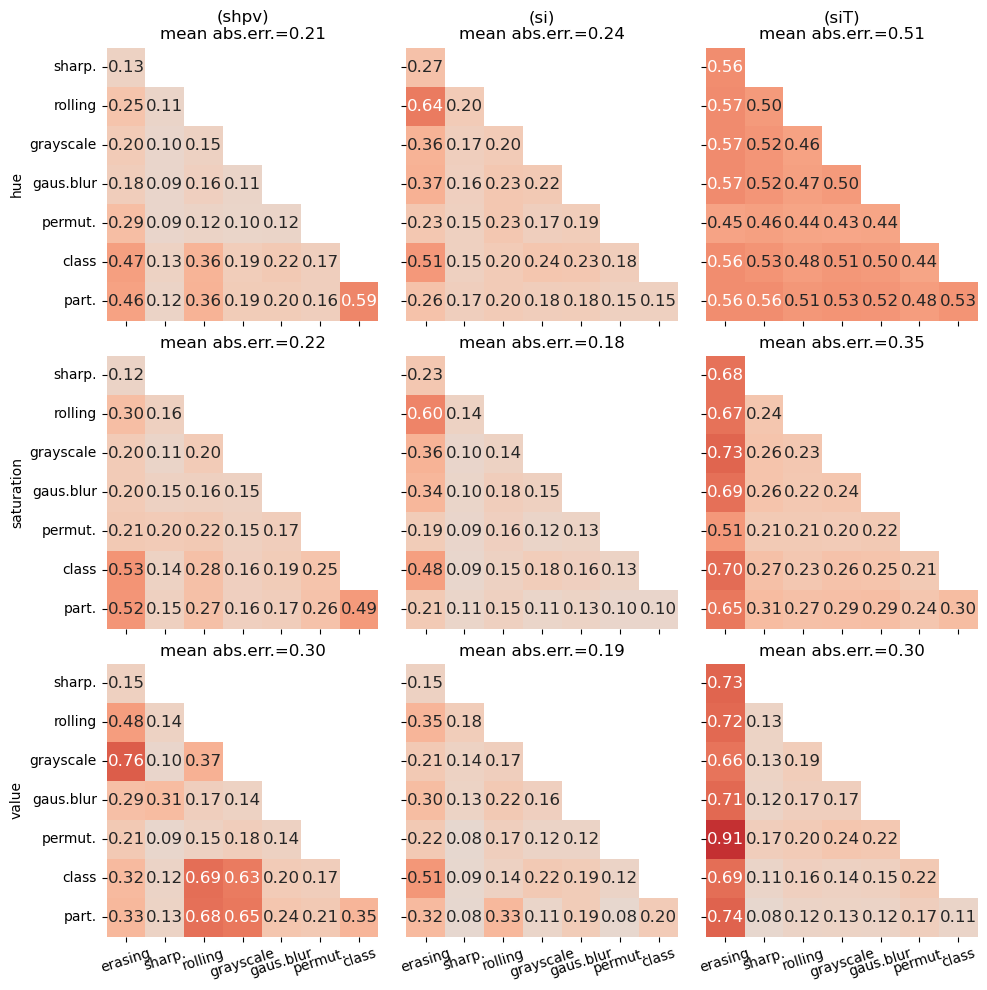


			features.9


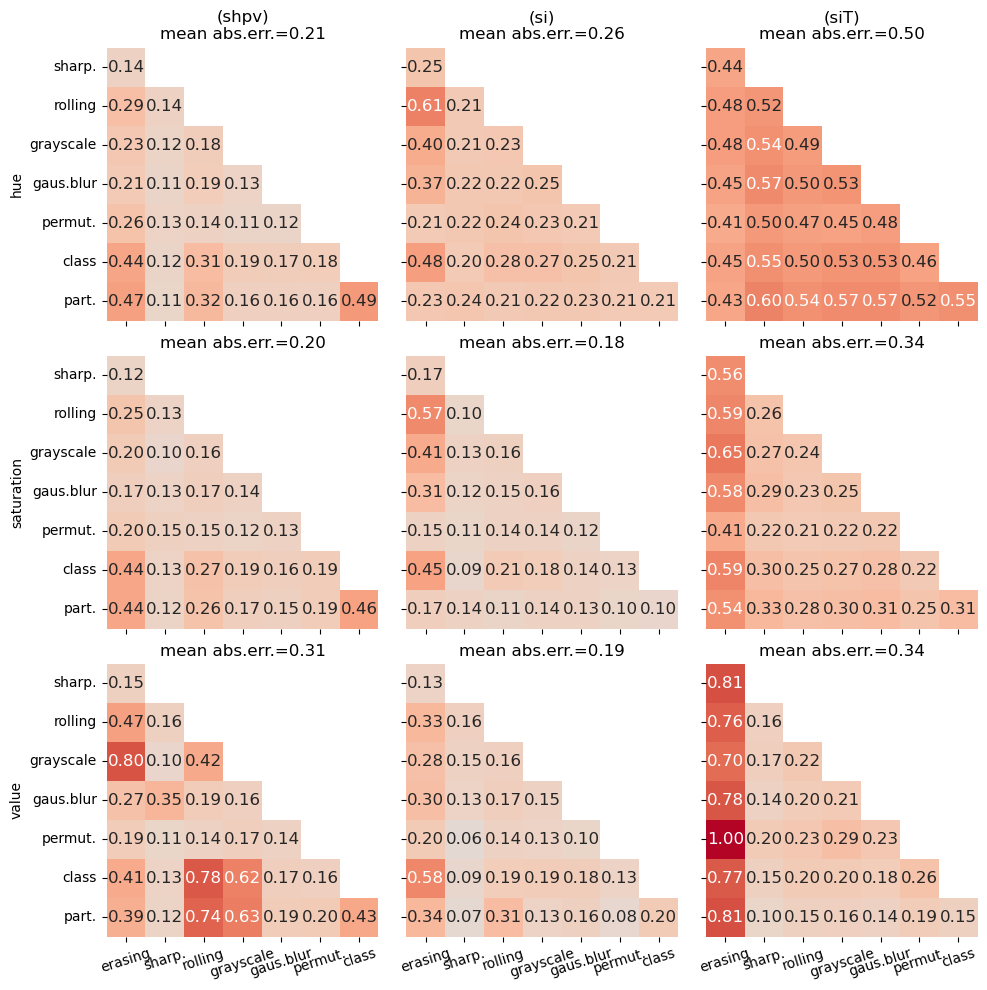


			avgpool


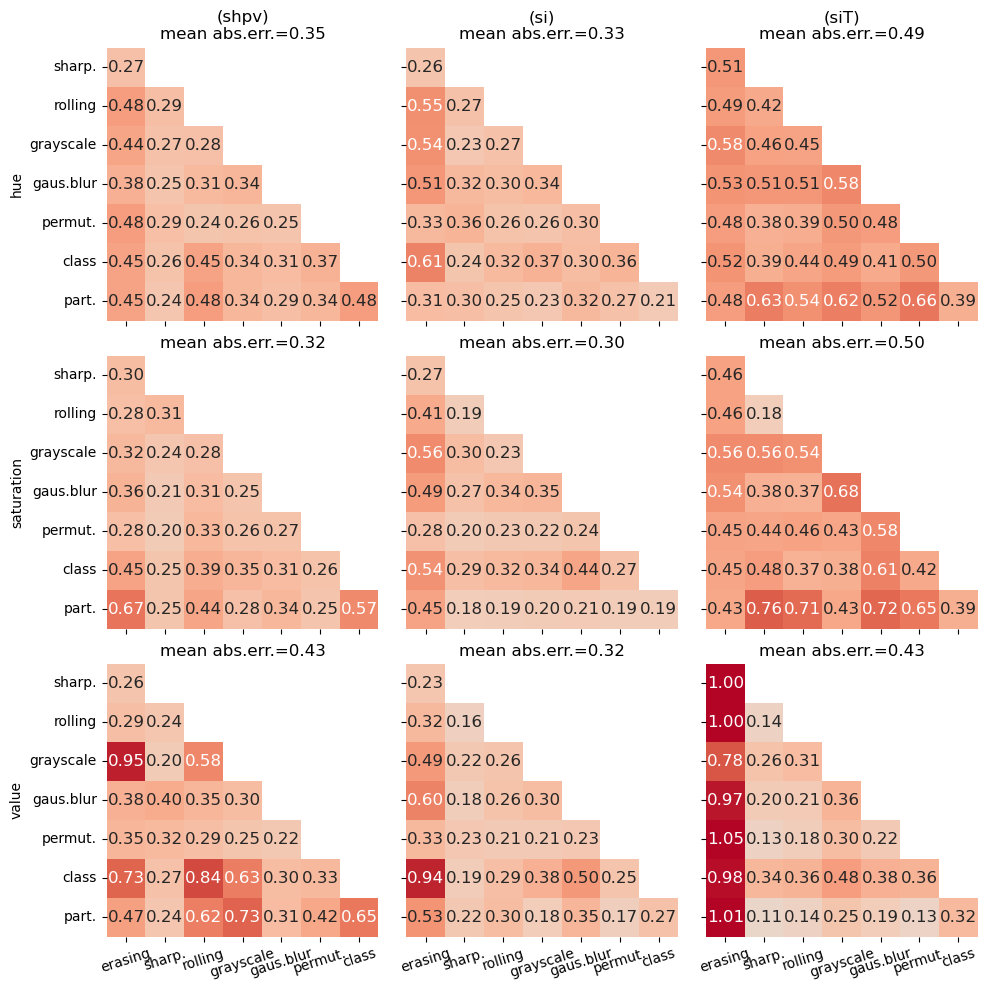

In [22]:
augmentation_set_number = 1

correlation.su_visualize.unit_mean_pixelwise_diff_correlation_patterns(
    alexnet_mean_cormat_diff[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    augmentation_set_number,
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    cmap=cmap_uw_means_diff_cm,
    figsize=figsize_uw_means_diff_cm_1,
    show=show,
)

#### 1.3.1.2 Augmentation set 2

[[Return back]](#1.3.1-Unit-wise-means)


			features.2


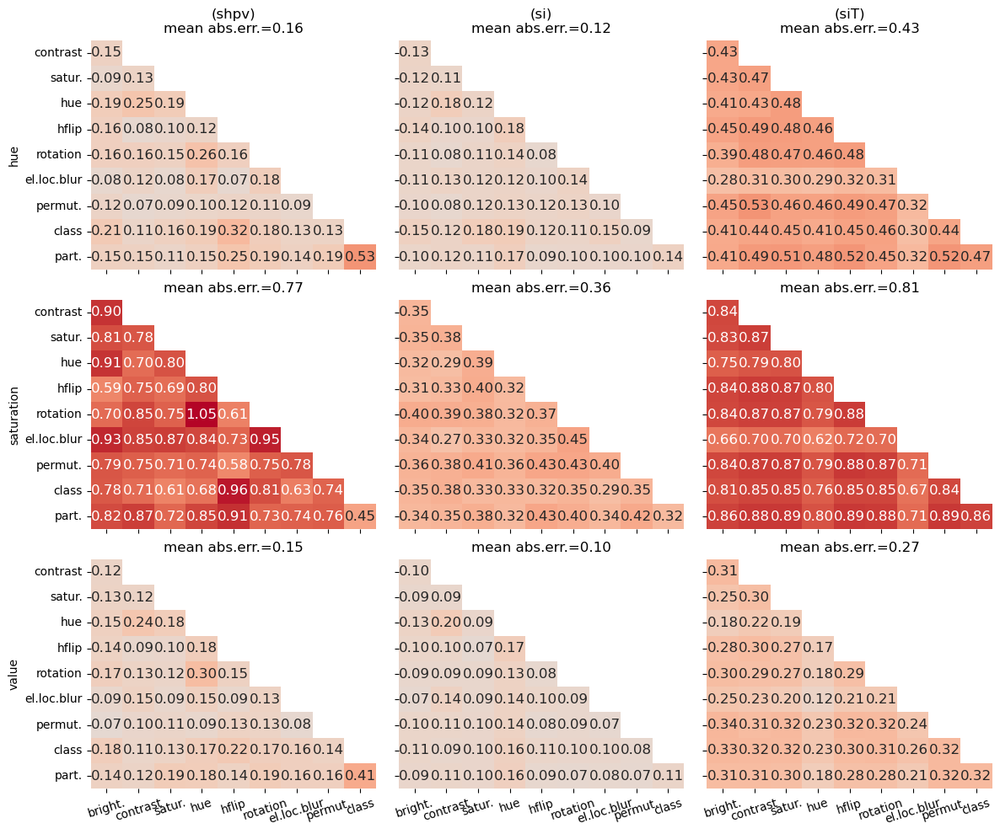


			features.5


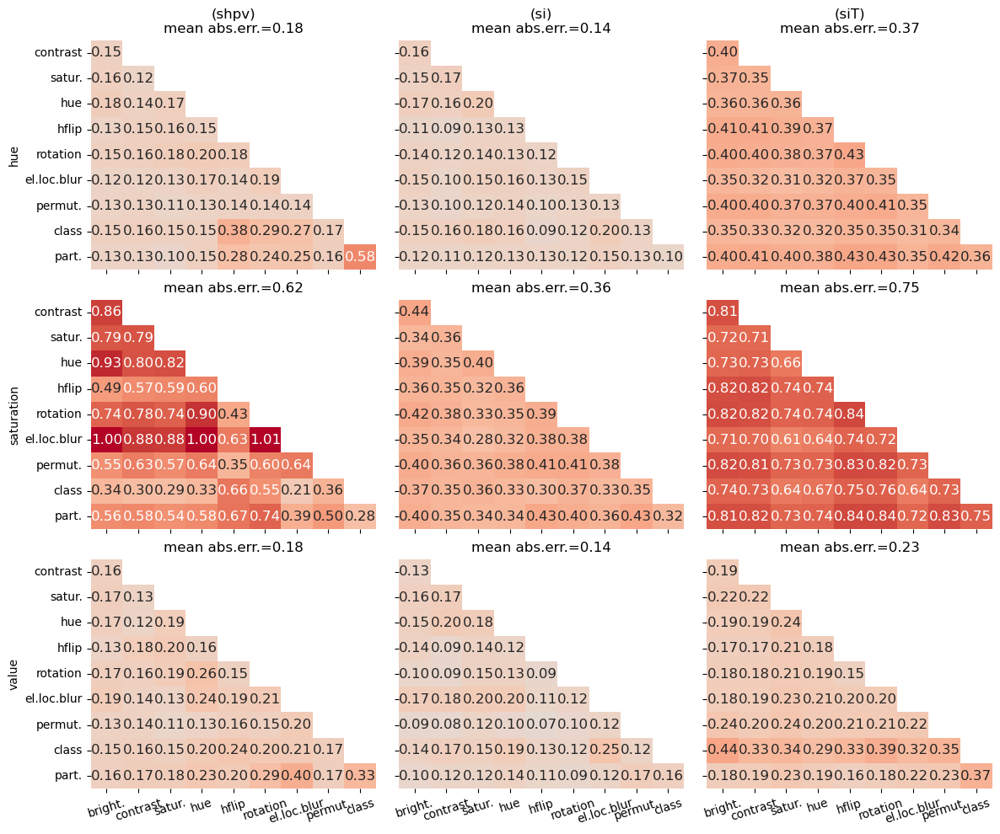


			features.7


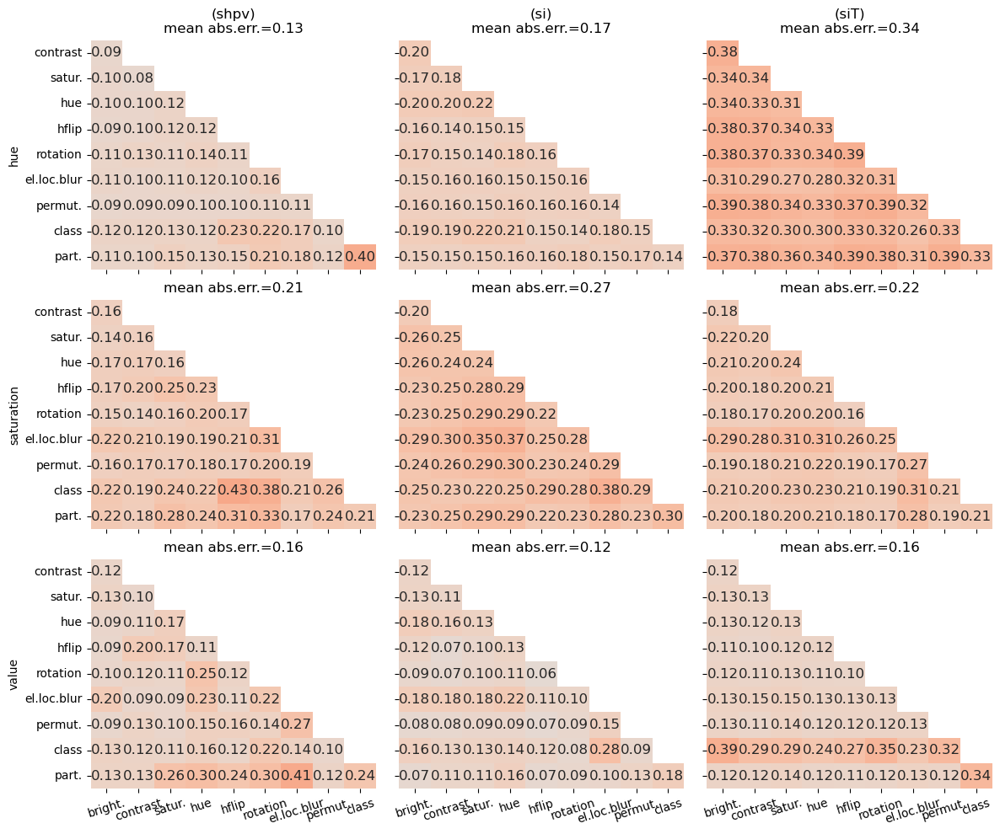


			features.9


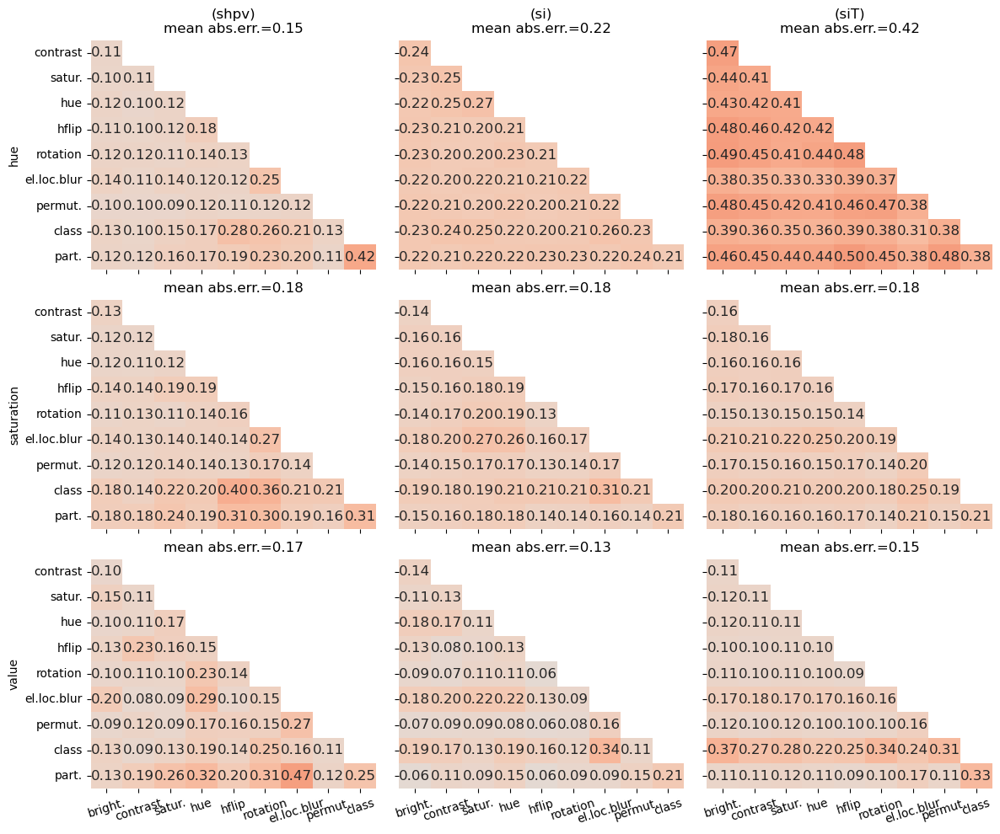


			avgpool


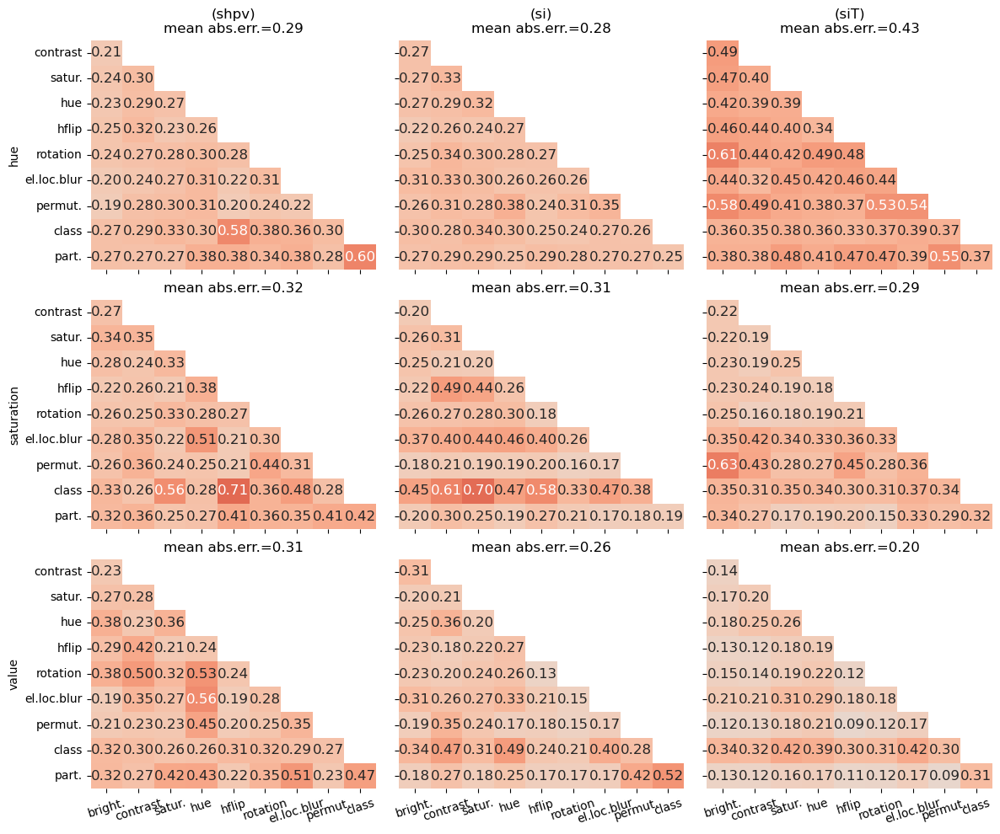

In [23]:
augmentation_set_number = 2

correlation.su_visualize.unit_mean_pixelwise_diff_correlation_patterns(
    alexnet_mean_cormat_diff[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    augmentation_set_number,
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    cmap=cmap_uw_means_diff_cm,
    figsize=figsize_uw_means_diff_cm_2,
    show=show,
)

### 1.3.2 Consolidated summary plots

- [1.3.2.1 Augmentation set 1](#1.3.2.1-Augmentation-set-1)
- [1.3.2.2 Augmentation set 2](#1.3.2.2-Augmentation-set-2)

[[Back to subsection]](#1.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))

#### 1.3.2.1 Augmentation set 1

[[Return back]](#1.3.2-Consolidated-summary-plots)

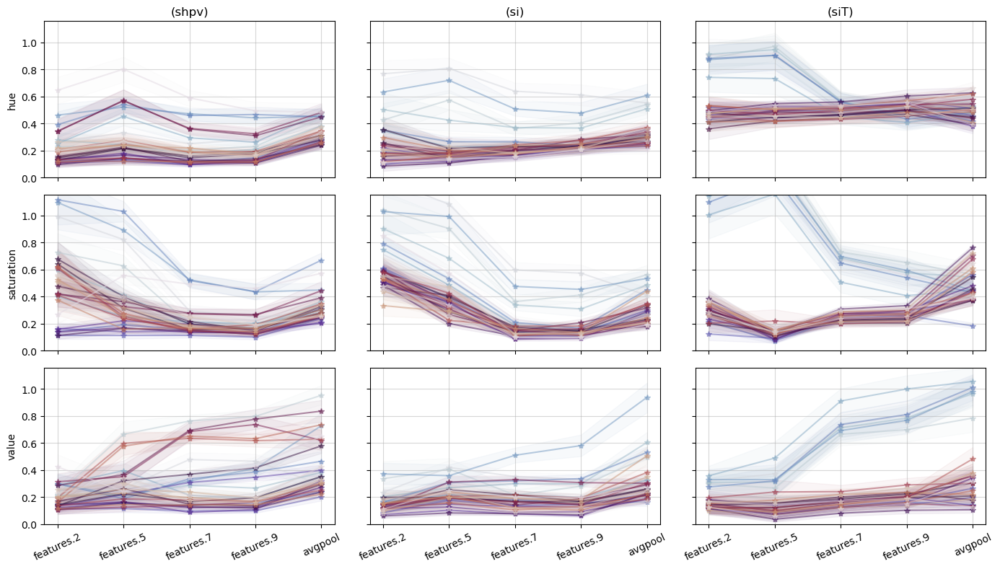

In [24]:
augmentation_set_number = 1

correlation.su_visualize.plot_consolidated_paired_correlations_fixed_values(
    alexnet_mean_cormat_diff[augmentation_set_number],
    alexnet_ci_lower_cormat_diff[augmentation_set_number],
    alexnet_ci_upper_cormat_diff[augmentation_set_number],
    None,
    None,
    None,
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    show=show,
    figsize=figsize_corr_consolidated_diff,
    cmap=cmap_corr_consolidated,
    no_chan_name=no_chan_name,
    vmin=0,
)

#### 1.3.3.2 Augmentation set 2

[[Return back]](#1.3.3-Consolidated-summary-plots)

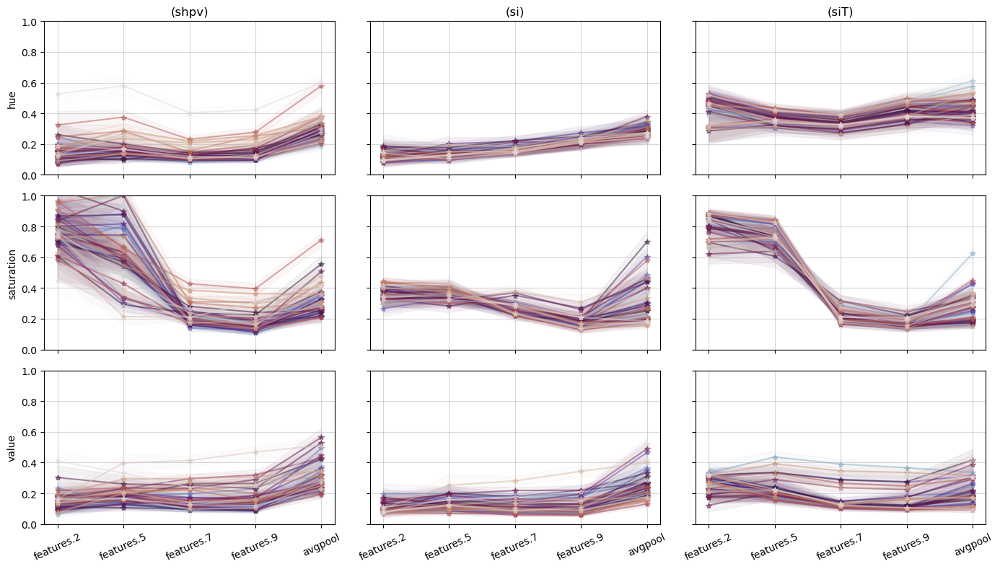

In [25]:
augmentation_set_number = 2

correlation.su_visualize.plot_consolidated_paired_correlations_fixed_values(
    alexnet_mean_cormat_diff[augmentation_set_number],
    alexnet_ci_lower_cormat_diff[augmentation_set_number],
    alexnet_ci_upper_cormat_diff[augmentation_set_number],
    None,
    None,
    None,
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    show=show,
    figsize=figsize_corr_consolidated_diff,
    cmap=cmap_corr_consolidated,
    no_chan_name=no_chan_name,
    vmin=0,
)

### 1.3.3 Widths of confidence intervals

[[Back to subsection]](#1.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))

In [71]:
correlation.su_visualize.print_ci_interval_widths_cormat_diff(
    alexnet_mean_cormat_diff,
    alexnet_ci_lower_cormat_diff,
    alexnet_ci_upper_cormat_diff,
    alexnet_network_modules,
    chans_name_list,
    value_name_list,
    augmentation_set_numbers_list,
    alexnet_n_conv_modules,
    extract_auxilliary_names=True
)


aug=1, features.2, hue, shpv:  0.047487355 <= delta <= 0.199089775
aug=1, features.2, hue, si:  0.061231798 <= delta <= 0.246364431
aug=1, features.2, hue, siT:  0.111308725 <= delta <= 0.238294960
aug=1, features.2, saturation, shpv:  0.000000000 <= delta <= 0.402301086
aug=1, features.2, saturation, si:  0.053582098 <= delta <= 0.336703475
aug=1, features.2, saturation, siT:  0.000000000 <= delta <= 0.355159800
aug=1, features.2, value, shpv:  0.000000000 <= delta <= 0.176074074
aug=1, features.2, value, si:  0.000000000 <= delta <= 0.244122657
aug=1, features.2, value, siT:  0.000000000 <= delta <= 0.162906573
aug=1, features.5, hue, shpv:  0.000000000 <= delta <= 0.183514066
aug=1, features.5, hue, si:  0.000000000 <= delta <= 0.193219174
aug=1, features.5, hue, siT:  0.000000000 <= delta <= 0.240325110
aug=1, features.5, saturation, shpv:  0.000000000 <= delta <= 0.157440880
aug=1, features.5, saturation, si:  0.000000000 <= delta <= 0.214840371
aug=1, features.5, saturation, siT:

### 1.4 Mean absolute norm between (space-wise) correlation matrices for pairs of layers

[[$\leftarrow$Prev.subsect.]](#1.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))$\quad$[[Back to section]](#1.-Alexnet)$\quad$[[Next subsect.$\to$]](#1.5-Correlation-patterns-extracted-from-correlation-matrices-for-paired-layers)

- [1.4.1 Augmentation set 1](#1.4.1-Augmentation-set-1)
- [1.4.2 Augmentation set 2](#1.4.2-Augmentation-set-2)
- [1.4.3 Widths of confidence intervals](#1.4.3-Widths-of-confidence-intervals)

#### 1.4.1 Augmentation set 1

[[Return back]](#1.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)

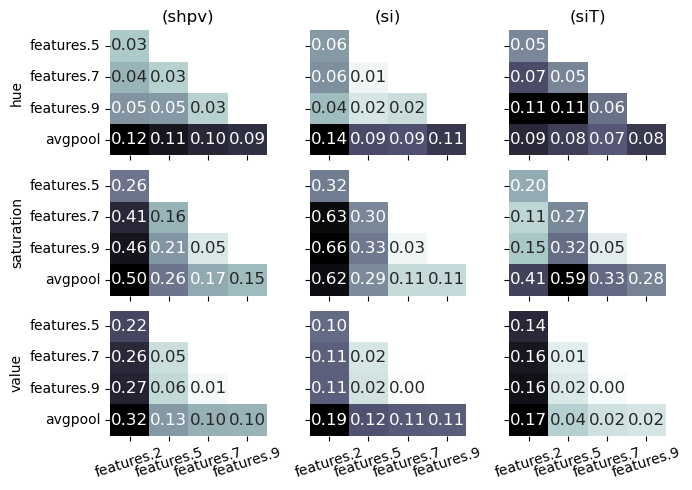

In [32]:
augmentation_set_number = 1

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{alexnet_network_name}_{dataset_name}/hsv_diff_patterns_among_checkpoints/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'alexnet_hsv_diff_patterns_among_chkpts'

tmp = alexnet_cm_mean_hsv_diff_dict[augmentation_set_number]
tmp = tmp[~np.isnan(tmp)]
tmp = tmp[~np.isinf(tmp)]
vmax = tmp.max()

correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    alexnet_cm_mean_hsv_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
    cmap=cmap_unit_cm_patterns,
    figsize=figsize_unit_cm_patterns,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    #cmap_bounds=(0, vmax),
    cormat_nanmask=np.isinf(alexnet_cm_mean_hsv_diff_dict[augmentation_set_number]),
)

#### 1.4.2 Augmentation set 2

[[Return back]](#1.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)

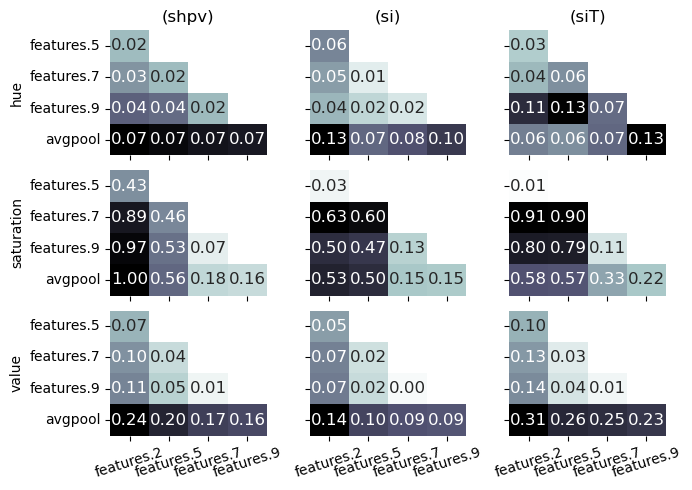

In [33]:
augmentation_set_number = 2

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{alexnet_network_name}_{dataset_name}/hsv_diff_patterns_among_checkpoints/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'alexnet_hsv_diff_patterns_among_chkpts'

tmp = alexnet_cm_mean_hsv_diff_dict[augmentation_set_number]
tmp = tmp[~np.isnan(tmp)]
tmp = tmp[~np.isinf(tmp)]
vmax = tmp.max()

correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    alexnet_cm_mean_hsv_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
    cmap=cmap_unit_cm_patterns,
    figsize=figsize_unit_cm_patterns,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    #cmap_bounds=(0, vmax),
    cormat_nanmask=np.isinf(alexnet_cm_mean_hsv_diff_dict[augmentation_set_number]),
)

#### 1.4.3 Widths of confidence intervals

[[Return back]](#1.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)

In [72]:
correlation.su_visualize.print_ci_interval_widths_cormat_diff2(
    alexnet_cm_mean_hsv_diff_dict,
    alexnet_cm_ci_lower_hsv_diff_dict,
    alexnet_cm_ci_upper_hsv_diff_dict,
    alexnet_network_modules,
    chans_name_list,
    value_name_list,
    augmentation_set_numbers_list,
    alexnet_n_conv_modules,
    extract_auxilliary_names=True
)

aug=1, features.2--features.5, hue, shpv:  delta=0.017
aug=1, features.2--features.5, hue, si:  delta=0.012
aug=1, features.2--features.5, hue, siT:  delta=0.029
aug=1, features.2--features.5, saturation, shpv:  delta=0.105
aug=1, features.2--features.5, saturation, si:  delta=0.062
aug=1, features.2--features.5, saturation, siT:  delta=0.062
aug=1, features.2--features.5, value, shpv:  delta=0.158
aug=1, features.2--features.5, value, si:  delta=0.082
aug=1, features.2--features.5, value, siT:  delta=0.079
aug=1, features.2--features.7, hue, shpv:  delta=0.023
aug=1, features.2--features.7, hue, si:  delta=0.012
aug=1, features.2--features.7, hue, siT:  delta=0.021
aug=1, features.2--features.7, saturation, shpv:  delta=0.205
aug=1, features.2--features.7, saturation, si:  delta=0.063
aug=1, features.2--features.7, saturation, siT:  delta=0.105
aug=1, features.2--features.7, value, shpv:  delta=0.198
aug=1, features.2--features.7, value, si:  delta=0.081
aug=1, features.2--features.7,

### 1.5 Correlation patterns extracted from correlation matrices for paired layers

[[$\leftarrow$Prev.subsect.]](#1.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)$\quad$[[Back to section]](#1.-Alexnet)$\quad$[[Next subsect.$\to$]](#1.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)

- [1.5.1 Augmentation set 1](#1.5.1-Augmentation-set-1)
- [1.5.2 Augmentation set 2](#1.5.2-Augmentation-set-2)

#### 1.5.1 Augmentation set 1

[[Back to subsection]](#1.5-Correlation-patterns-extracted-from-correlation-matrices-for-paired-layers)

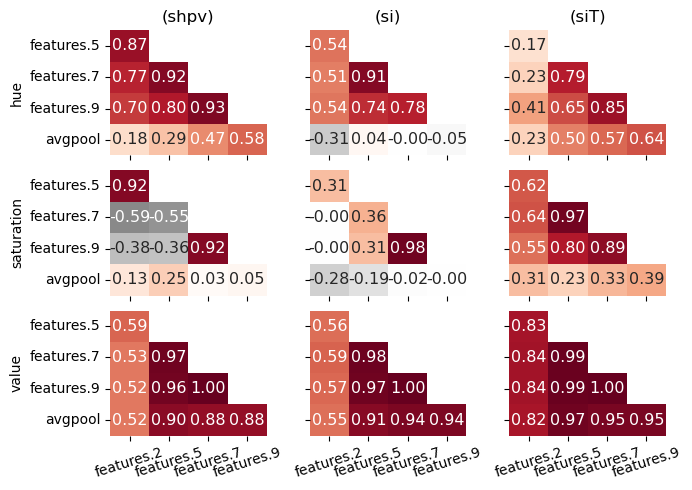

In [35]:
augmentation_set_number = 1

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{alexnet_network_name}_{dataset_name}/hsv_diff_patterns_among_checkpoints_corr/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'alexnet_hsv_diff_patterns_among_chkpts_corr'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    alexnet_cm_corr_hsv_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
    #cmap='Spectral_r',
    cmap='RdGy_r',
    figsize=figsize_unit_cm_patterns,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    cmap_bounds=(-1, 1),
    cormat_nanmask=alexnet_cm_corr_hsv_diff_nanmask_dict[augmentation_set_number],
    text_size=11.5
)

#### 1.5.2 Augmentation set 2

[[Back to subsection]](#1.5-Correlation-patterns-extracted-from-correlation-matrices-for-paired-layers)

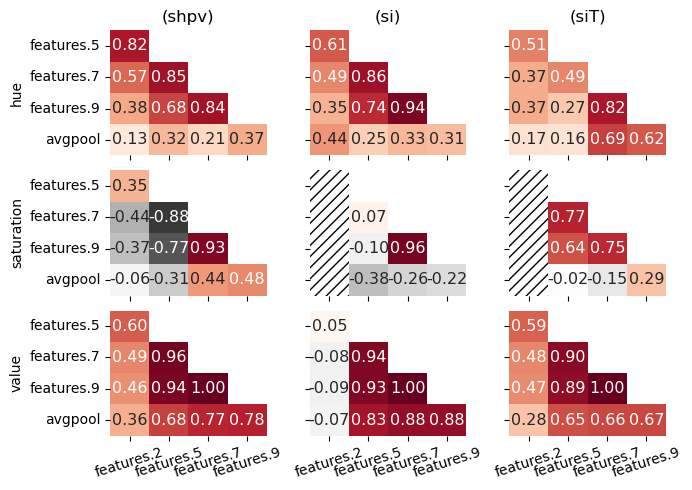

In [36]:
augmentation_set_number = 2

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{alexnet_network_name}_{dataset_name}/hsv_diff_patterns_among_checkpoints_corr/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'alexnet_hsv_diff_patterns_among_chkpts_corr'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    alexnet_cm_corr_hsv_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
    cmap='RdGy_r',
    figsize=figsize_unit_cm_patterns,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    cmap_bounds=(-1, 1),
    cormat_nanmask=alexnet_cm_corr_hsv_diff_nanmask_dict[augmentation_set_number],
    text_size=11.5
)

### 1.6 Mean absolute norm between (space-wise) original-channel differences of correlation matrices for pairs of layers

[[$\leftarrow$Prev.subsect.]](#1.5-Correlation-patterns-extracted-from-correlation-matrices-for-paired-layers)$\quad$[[Back to section]](#1.-Alexnet)$\quad$[[Next subsect.$\to$]](#1.7-Correlation-patterns-extracted-from-original-channel-correlation-matrices-for-paired-layers)

- [1.6.1 Augmentation set 1](#1.6.1-Augmentation-set-1)
- [1.6.2 Augmentation set 2](#1.6.2-Augmentation-set-2)
- [1.6.3 Widths of confidence intervals](#1.6.3-Widths-of-confidence-intervals)

#### 1.6.1 Augmentation set 1

[[Return back]](#1.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)

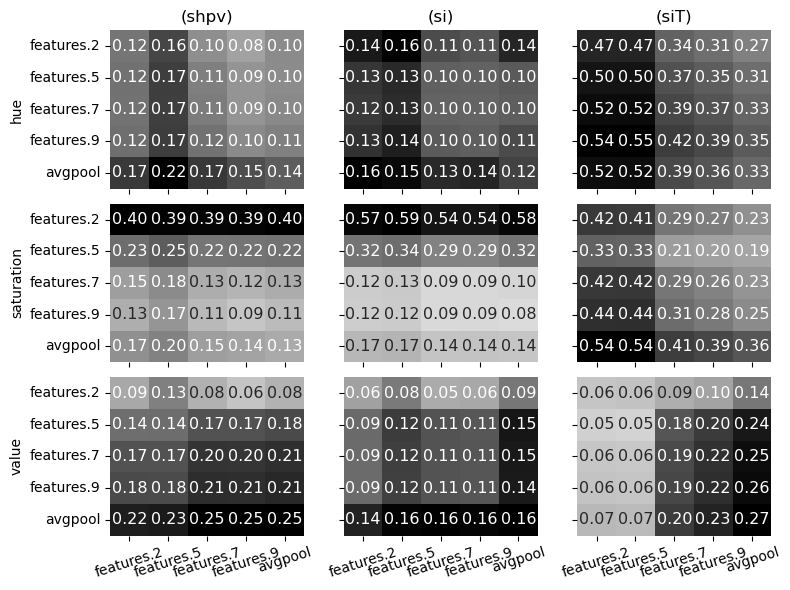

In [37]:
augmentation_set_number = 1

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{alexnet_network_name}_{dataset_name}/hsv_diff_patterns_with_orig/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'alexnet_hsv_diff_patterns_with_orig'

tmp = alexnet_cm_mean_hsv_orig_diff_dict[augmentation_set_number]
tmp = tmp[~np.isnan(tmp)]
tmp = tmp[~np.isinf(tmp)]
vmax = tmp.max()

correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    alexnet_cm_mean_hsv_orig_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
    cmap=cmap_uw_means_diff_cm_norm_orig_chan,
    figsize=figsize_uw_means_diff_cm_norm_orig_chan,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    text_size=11.5
    #cmap_bounds=(0, vmax),
)

#### 1.6.2 Augmentation set 2

[[Return back]](#1.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)

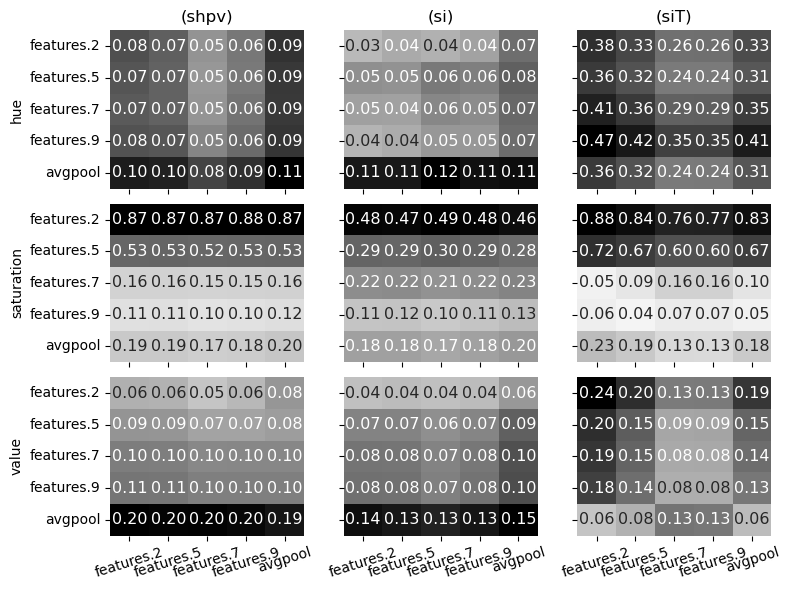

In [38]:
augmentation_set_number = 2

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{alexnet_network_name}_{dataset_name}/hsv_diff_patterns_with_orig/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'alexnet_hsv_diff_patterns_with_orig'


tmp = alexnet_cm_mean_hsv_orig_diff_dict[augmentation_set_number]
tmp = tmp[~np.isnan(tmp)]
tmp = tmp[~np.isinf(tmp)]
vmax = tmp.max()

correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    alexnet_cm_mean_hsv_orig_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
    cmap=cmap_uw_means_diff_cm_norm_orig_chan,
    figsize=figsize_uw_means_diff_cm_norm_orig_chan,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    text_size=11.5
    #cmap_bounds=(0, vmax),
)

#### 1.6.3 Widths of confidence intervals

[[Return back]](#1.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)

In [40]:
correlation.su_visualize.print_ci_interval_widths_cm_hsv_diff(
    alexnet_cm_mean_hsv_orig_diff_dict,
    alexnet_cm_ci_lower_hsv_orig_diff_dict,
    alexnet_cm_ci_upper_hsv_orig_diff_dict,
    alexnet_network_modules,
    chans_name_list,
    value_name_list,
    augmentation_set_numbers_list,
    alexnet_n_conv_modules,
    extract_auxilliary_names=True
)

aug=1, features.2--features.2, hue, shpv:  delta=0.114
aug=1, features.2--features.2, hue, si:  delta=0.136
aug=1, features.2--features.2, hue, siT:  delta=0.213
aug=1, features.2--features.2, saturation, shpv:  delta=0.258
aug=1, features.2--features.2, saturation, si:  delta=0.238
aug=1, features.2--features.2, saturation, siT:  delta=0.316
aug=1, features.2--features.2, value, shpv:  delta=0.073
aug=1, features.2--features.2, value, si:  delta=0.051
aug=1, features.2--features.2, value, siT:  delta=0.056
aug=1, features.2--features.5, hue, shpv:  delta=0.140
aug=1, features.2--features.5, hue, si:  delta=0.136
aug=1, features.2--features.5, hue, siT:  delta=0.179
aug=1, features.2--features.5, saturation, shpv:  delta=0.262
aug=1, features.2--features.5, saturation, si:  delta=0.261
aug=1, features.2--features.5, saturation, siT:  delta=0.316
aug=1, features.2--features.5, value, shpv:  delta=0.096
aug=1, features.2--features.5, value, si:  delta=0.072
aug=1, features.2--features.5,

### 1.7 Correlation patterns extracted from original-channel correlation matrices for paired layers

[[$\leftarrow$Prev.subsect.]](#1.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)$\quad$[[Back to section]](#1.-Alexnet)$\quad$

- [1.7.1 Augmentation set 1](#1.7.1-Augmentation-set-1)
- [1.7.2 Augmentation set 2](#1.7.2-Augmentation-set-2)

#### 1.7.1 Augmentation set 1


[[Back to subsection]](#1.7-Correlation-patterns-extracted-from-original-channel-correlation-matrices-for-paired-layers)

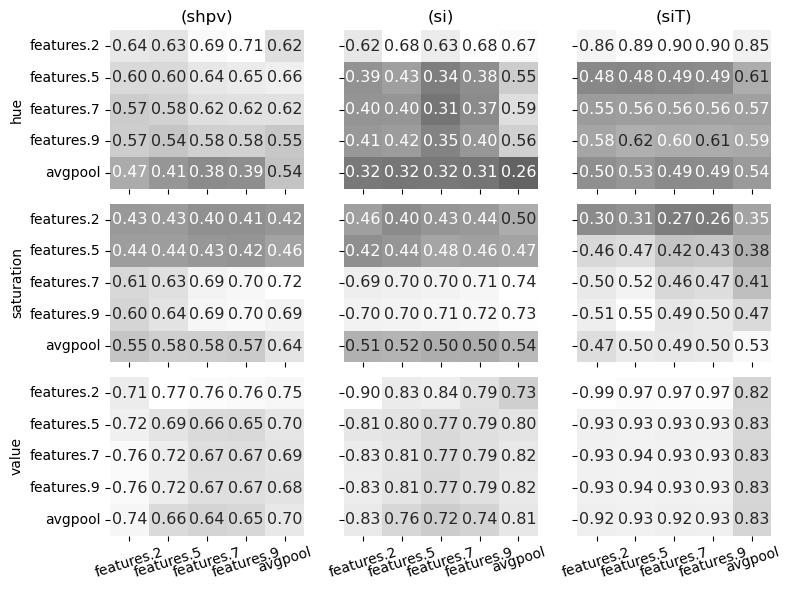

In [41]:
augmentation_set_number = 1

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{alexnet_network_name}_{dataset_name}/hsv_diff_patterns_with_orig_corr/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'alexnet_hsv_diff_patterns_with_orig_corr'

tmp = alexnet_cm_corr_hsv_orig_diff_dict[augmentation_set_number]
vmin = tmp.min()
vmax = tmp.max()

correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    alexnet_cm_corr_hsv_orig_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
    cmap='gist_yarg_r',
    figsize=figsize_uw_means_diff_cm_norm_orig_chan,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    #cmap_bounds=(vmin, vmax),
    cormat_nanmask=alexnet_cm_corr_hsv_orig_diff_nanmask_dict[augmentation_set_number],
    text_size=11.5
)

#### 1.7.2 Augmentation set 2


[[Back to subsection]](#1.7-Correlation-patterns-extracted-from-original-channel-correlation-matrices-for-paired-layers)

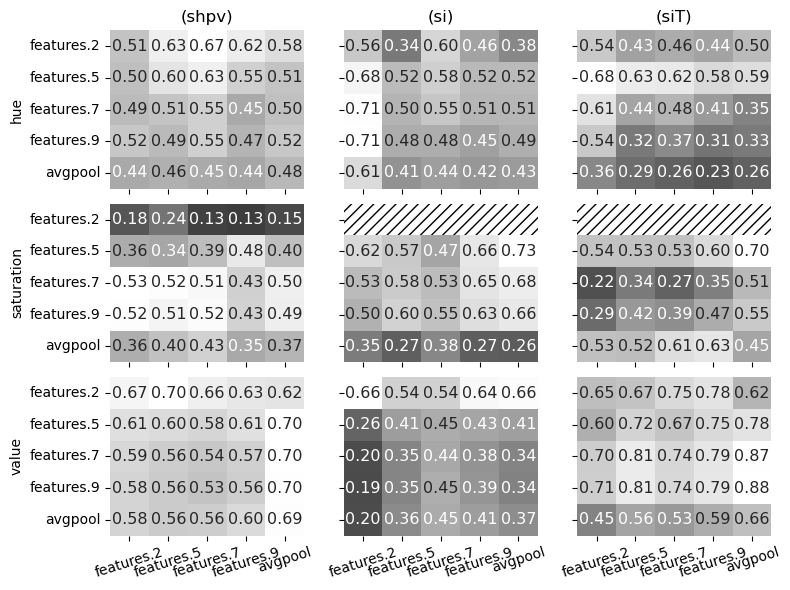

In [42]:
augmentation_set_number = 2

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{alexnet_network_name}_{dataset_name}/hsv_diff_patterns_with_orig_corr/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'alexnet_hsv_diff_patterns_with_orig_corr'

tmp = alexnet_cm_corr_hsv_orig_diff_dict[augmentation_set_number]
tmp = tmp[~np.isnan(tmp)]
vmin = tmp.min()
vmax = tmp.max()

correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    alexnet_cm_corr_hsv_orig_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
    cmap='gist_yarg_r',
    figsize=figsize_uw_means_diff_cm_norm_orig_chan,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    #cmap_bounds=(-1, 1),
    cormat_nanmask=alexnet_cm_corr_hsv_orig_diff_nanmask_dict[augmentation_set_number],
    text_size=11.5
)

## 2. ResNet18

[[$\leftarrow$ Prev.part]](#1.-Alexnet) $\qquad$ [[Back to top]](#Navigation) $\qquad$


- [2.1 Setting up the configuration variables](#2.1-Setting-up-the-configuration-variables)
- [2.2 Correlation (space-wise) between pairs of augmentation variables](#2.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)
- [2.3 Mean absolute differences between (space-wise) correlation matrices (original and cut submodule)](#2.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))
- [2.4 Mean absolute norm between (space-wise) correlation matrices for pairs of layers](#2.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)
- [2.5 Correlation patterns extracted from correlation matrices for paired layers](#2.5-Correlation-patterns-extracted-from-correlation-matrices-for-paired-layers)
- [2.6 Mean absolute norm between (space-wise) original-channel differences of correlation matrices for pairs of layers](#2.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)
- [2.7 Correlation patterns extracted from original-channel correlation matrices for paired layers](#2.7-Correlation-patterns-extracted-from-original-channel-correlation-matrices-for-paired-layers)

### 2.1 Setting up the configuration variables

$\quad$ [[Back to section]](#2.-VGG11)$\quad$[[Next subsect.$\to$]](#2.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)


In [43]:
resnet18_network_name = 'resnet18'
resnet18_network_modules = [
    'maxpool', # conv2d -> BN -> ReLU -> MaxPool2d
    'layer1', # Basic ResNet Block 1
    'layer2', # Basic ResNet Block 2
    'layer3', # Basic ResNet Block 3
    'avgpool', # Basic ResNet Block 1 -> AvgPool
    #'fc'
]
resnet18_n_conv_modules = len(
    list(
        filter(
            lambda x: ('maxpool' in x) or ('layer' in x),# or ('avgpool' in x),
            resnet18_network_modules
        )
    )
)

resnet18_values_fnms_dict = preparation.single_unit.extract_massive_values_fnms(
    resnet18_network_name,
    values_fnm_base,
    augmentation_set_numbers_list,
    prefix=None
);

resnet18_hsv_values_fnms_dict = preparation.single_unit.extract_channeled_single_units_values_fnms(
    resnet18_network_name,
    su_values_fnm_base,
    augmentation_set_numbers_list,
    channels=preparation.single_unit._HSVG_channel_names,
)

resnet18_json_config_path = f'./{resnet18_network_name}_single_units.json' # no offset needed
resnet18_analysis_config_list = preparation.single_unit.load_config_from_json(resnet18_json_config_path)[:-1]
resnet18_analysis_config_list = preparation.single_unit.extract_neuron_indices(resnet18_analysis_config_list)

In [ ]:
resnet18_results_hsv, resnet18_results_orig = preparation.utils.get_original_and_channeled_values(
    resnet18_hsv_values_fnms_dict,
    os.path.join(notebook_directory_offset, su_activations_dirname),
    resnet18_values_fnms_dict,
    os.path.join(notebook_directory_offset, activations_dirname),
    resnet18_analysis_config_list,
    resnet18_network_modules,
    values_names_dict,
    augmentation_set_numbers_list,
    shpv_group_indices_dict,
    extract_auxilliary_names=extract_auxilliary_names,
)

In [ ]:
resnet18_mean_cormat_hsv_dict = {}
resnet18_ci_lower_cormat_hsv_dict = {}
resnet18_ci_upper_cormat_hsv_dict = {}
resnet18_nanmask_cormat_hsv_dict = {}
resnet18_mean_cormat_orig_dict = {}
resnet18_ci_lower_cormat_orig_dict = {}
resnet18_ci_upper_cormat_orig_dict = {}
resnet18_nanmask_cormat_orig_dict = {}
resnet18_mean_cormat_diff = {}
resnet18_ci_lower_cormat_diff = {}
resnet18_ci_upper_cormat_diff = {}
resnet18_nanmask_cormat_diff = {}


for augmentation_set_number in augmentation_set_numbers_list:
    (
        (mean_cormat_hsv, ci_lower_cormat_hsv, ci_upper_cormat_hsv, nanmask_cormat_hsv),
        (mean_cormat_orig, ci_lower_cormat_orig, ci_upper_cormat_orig, nanmask_cormat_orig),
        (mean_cormat_diff, ci_lower_cormat_diff, ci_upper_cormat_diff, nanmask_cormat_diff),
    ) = correlation.su_compute.extract_unit_mean_pixelwise_correlation_patterns(
        resnet18_results_hsv,
        resnet18_results_orig,
        resnet18_network_modules,
        augmentation_set_number,
        chans_name_list,
        value_name_list,
        extract_auxilliary_names=extract_auxilliary_names,
        nan_mask_policy='all',
    )
    resnet18_mean_cormat_hsv_dict[augmentation_set_number] = mean_cormat_hsv
    resnet18_ci_lower_cormat_hsv_dict[augmentation_set_number] = ci_lower_cormat_hsv
    resnet18_ci_upper_cormat_hsv_dict[augmentation_set_number] = ci_upper_cormat_hsv
    resnet18_nanmask_cormat_hsv_dict[augmentation_set_number] = nanmask_cormat_hsv
    resnet18_mean_cormat_orig_dict[augmentation_set_number] = mean_cormat_orig
    resnet18_ci_lower_cormat_orig_dict[augmentation_set_number] = ci_lower_cormat_orig
    resnet18_ci_upper_cormat_orig_dict[augmentation_set_number] = ci_upper_cormat_orig
    resnet18_nanmask_cormat_orig_dict[augmentation_set_number] = nanmask_cormat_orig
    resnet18_mean_cormat_diff[augmentation_set_number] = mean_cormat_diff
    resnet18_ci_lower_cormat_diff[augmentation_set_number] = ci_lower_cormat_diff
    resnet18_ci_upper_cormat_diff[augmentation_set_number] = ci_upper_cormat_diff
    resnet18_nanmask_cormat_diff[augmentation_set_number] = nanmask_cormat_diff


In [46]:
resnet18_cm_mean_hsv_diff_dict = {}
resnet18_cm_ci_lower_hsv_diff_dict = {}
resnet18_cm_ci_upper_hsv_diff_dict = {}
resnet18_cm_corr_hsv_diff_dict = {}
resnet18_cm_corr_hsv_diff_nanmask_dict = {}

resnet18_cm_mean_hsv_orig_diff_dict = {}
resnet18_cm_ci_lower_hsv_orig_diff_dict = {}
resnet18_cm_ci_upper_hsv_orig_diff_dict = {}
resnet18_cm_corr_hsv_orig_diff_dict = {}
resnet18_cm_corr_hsv_orig_diff_nanmask_dict = {}
for augmentation_set_number in augmentation_set_numbers_list:
    (
        (
            resnet18_cm_mean_hsv_diff,
            resnet18_cm_ci_lower_hsv_diff,
            resnet18_cm_ci_upper_hsv_diff,
            resnet18_cm_corr_hsv_diff,
            resnet18_cm_corr_hsv_diff_nanmask,
        ),
        (
            resnet18_cm_mean_hsv_orig_diff,
            resnet18_cm_ci_lower_hsv_orig_diff,
            resnet18_cm_ci_upper_hsv_orig_diff,
            resnet18_cm_corr_hsv_orig_diff,
            resnet18_cm_corr_hsv_orig_diff_nanmask,
        ),
    ) = correlation.su_compute.extract_hsv_correlation_layerwise_diff_patterns(
        resnet18_mean_cormat_hsv_dict[augmentation_set_number],
        resnet18_mean_cormat_orig_dict[augmentation_set_number],
        resnet18_network_modules[:resnet18_n_conv_modules],
        augmentation_set_number,
        chans_name_list,
        value_name_list,
        extract_auxilliary_names=extract_auxilliary_names,
    )
    resnet18_cm_mean_hsv_diff_dict[augmentation_set_number] = resnet18_cm_mean_hsv_diff
    resnet18_cm_ci_lower_hsv_diff_dict[augmentation_set_number] = resnet18_cm_ci_lower_hsv_diff
    resnet18_cm_ci_upper_hsv_diff_dict[augmentation_set_number] = resnet18_cm_ci_upper_hsv_diff
    resnet18_cm_corr_hsv_diff_dict[augmentation_set_number] = resnet18_cm_corr_hsv_diff
    resnet18_cm_corr_hsv_diff_nanmask_dict[augmentation_set_number] = resnet18_cm_corr_hsv_diff_nanmask
    resnet18_cm_mean_hsv_orig_diff_dict[augmentation_set_number] = resnet18_cm_mean_hsv_orig_diff
    resnet18_cm_ci_lower_hsv_orig_diff_dict[augmentation_set_number] = resnet18_cm_ci_lower_hsv_orig_diff
    resnet18_cm_ci_upper_hsv_orig_diff_dict[augmentation_set_number] = resnet18_cm_ci_upper_hsv_orig_diff
    resnet18_cm_corr_hsv_orig_diff_dict[augmentation_set_number] = resnet18_cm_corr_hsv_orig_diff
    resnet18_cm_corr_hsv_orig_diff_nanmask_dict[augmentation_set_number] = resnet18_cm_corr_hsv_orig_diff_nanmask

### 2.2 Correlation (space-wise) between pairs of augmentation variables

[[$\leftarrow$Prev.subsect.]](#2.1-Setting-up-the-configuration-variables)$\quad$[[Back to section]](#2.-ResNet18)$\quad$[[Next subsect.$\to$]](#2.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))

- [2.2.1 Unit-wise means](#2.2.1-Unit-wise-means)
- [2.2.2 Consolidated summary plots](#2.2.2-Consolidated-summary-plots)
- [2.2.3 Widths of confidence intervals](#2.2.3-Widths-of-confidence-intervals)

### 2.2.1 Unit-wise means

- [2.2.1.1 Augmentation set 1](#2.2.1.2-Augmentation-set-1)
- [2.2.1.2 Augmentation set 2](#2.2.1.2-Augmentation-set-2)

[[Back to subsection]](#2.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)

#### 2.2.1.1 Augmentation set 1

[[Return back]](#2.2.1-Unit-wise-means)


			maxpool


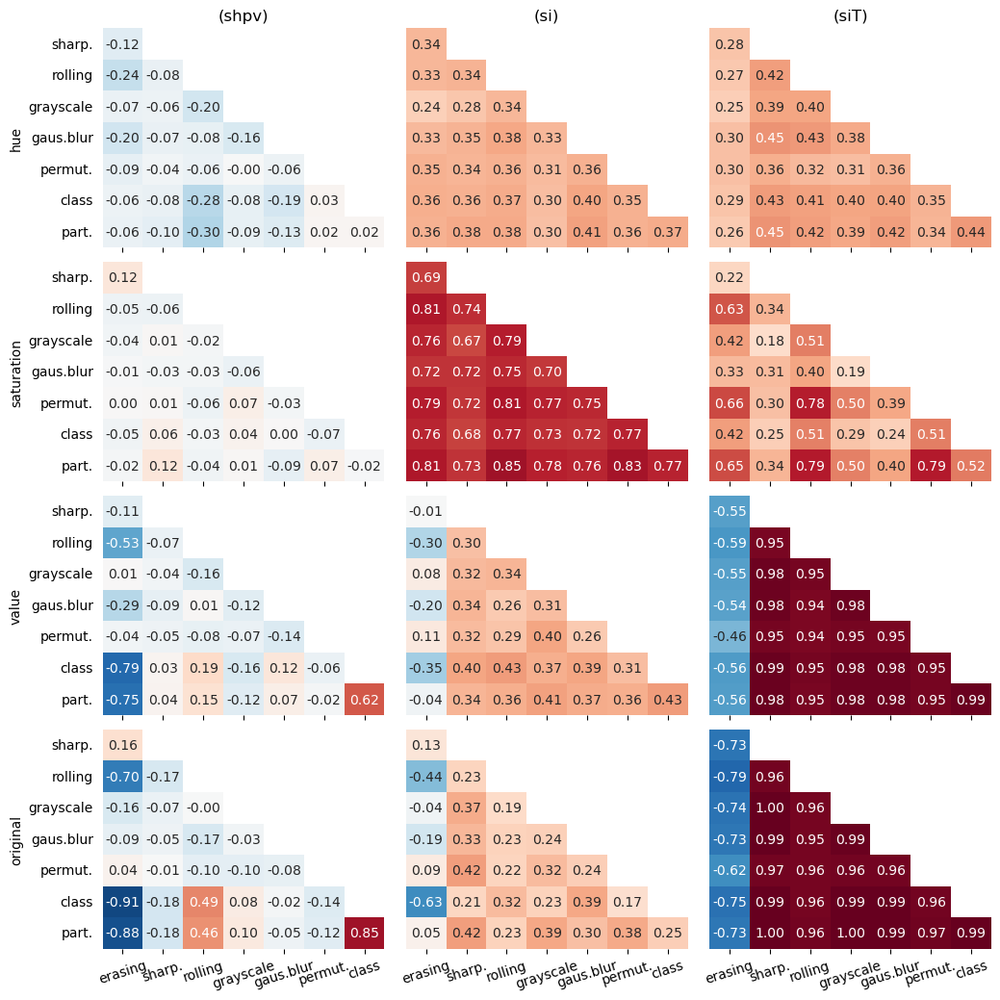


			layer1


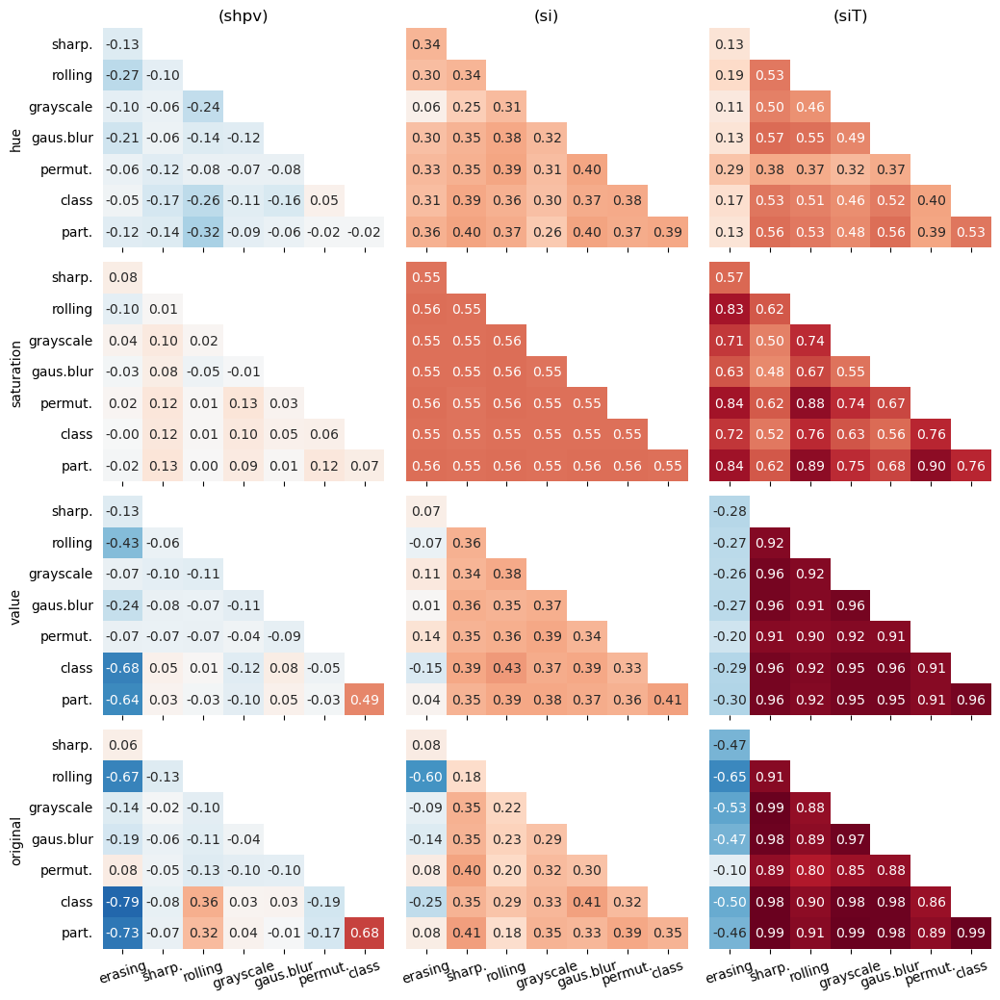


			layer2


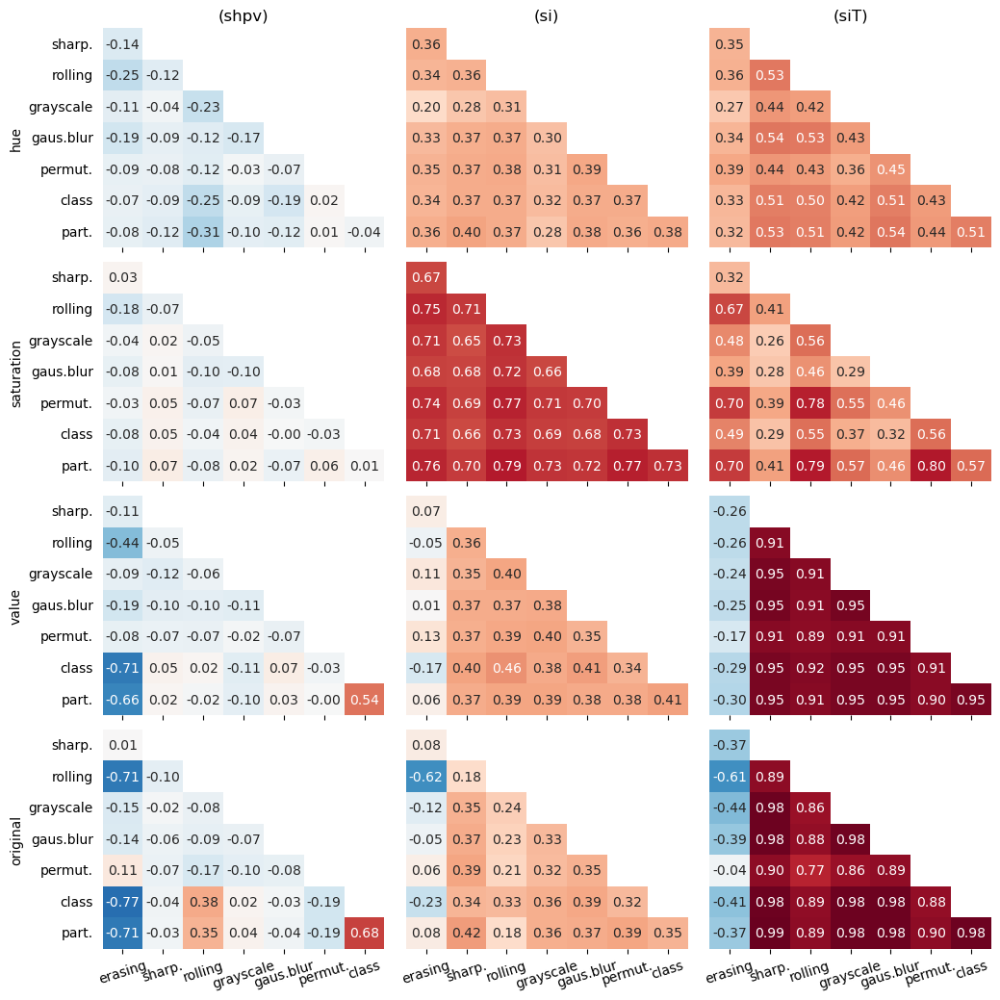


			layer3


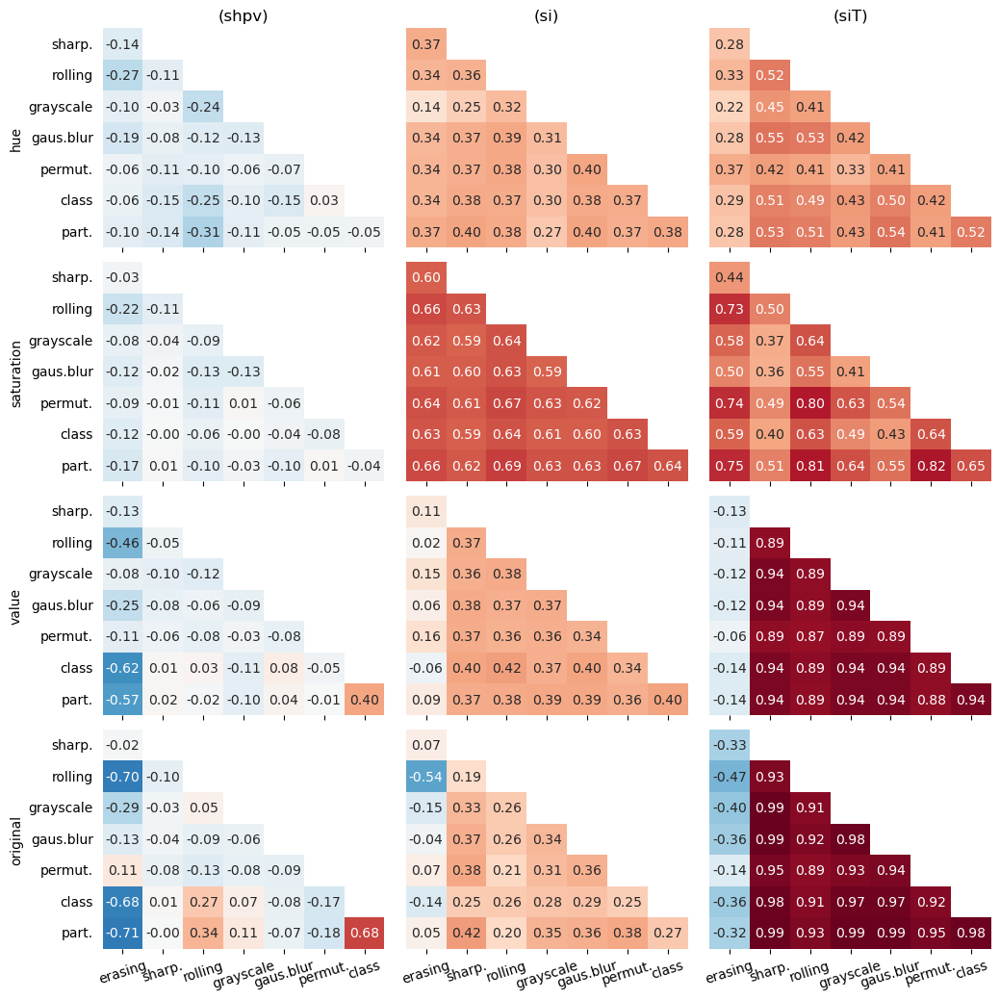

In [47]:
augmentation_set_number = 1

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{resnet18_network_name}_{dataset_name}/unit_mean_pixelwise_corpat/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'unit_mean_pixelwise_corpat_aug={augmentation_set_number}'


correlation.su_visualize.unit_mean_pixelwise_correlation_patterns(
    resnet18_mean_cormat_hsv_dict[augmentation_set_number],
    resnet18_mean_cormat_orig_dict[augmentation_set_number],
    resnet18_network_modules,
    augmentation_set_number,
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    cmap=cmap_uw_means_cm,
    figsize=figsize_uw_means_cm_1,
    show=show,
    no_chan_name=no_chan_name,
    save_dirname=save_dirname,
    save_filename_base=save_filename_base,
)

#### 2.2.1.2 Augmentation set 2

[[Return back]](#2.2.1-Unit-wise-means)


			maxpool


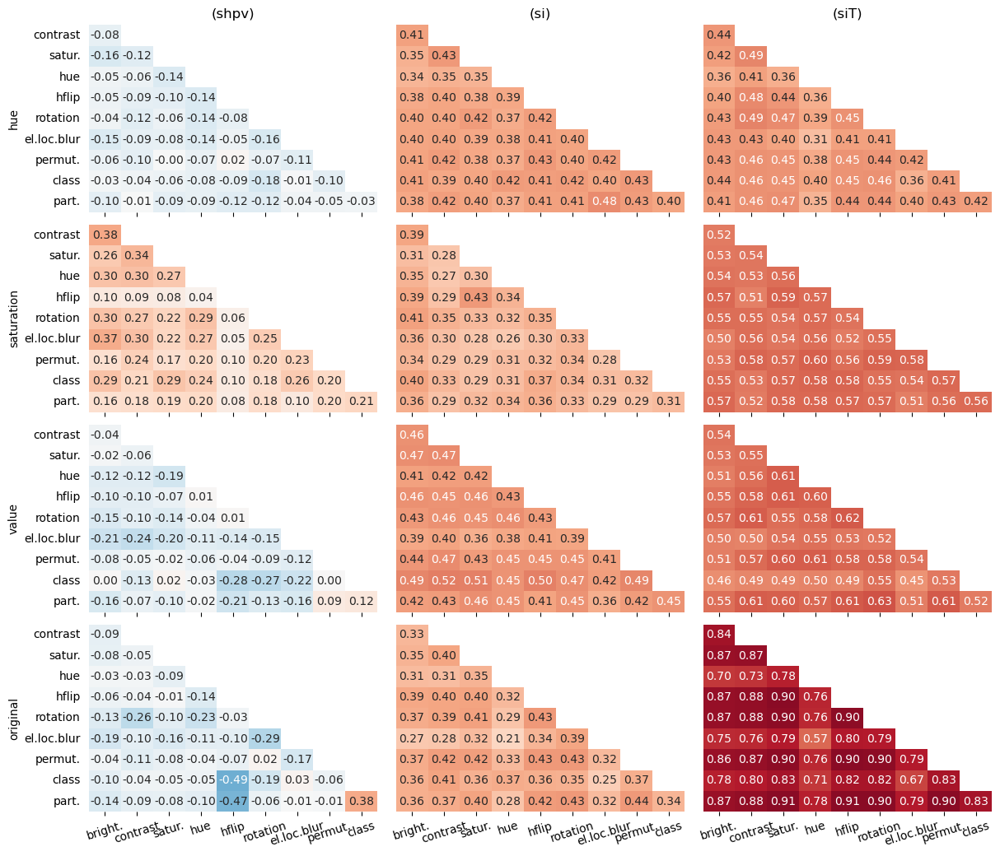


			layer1


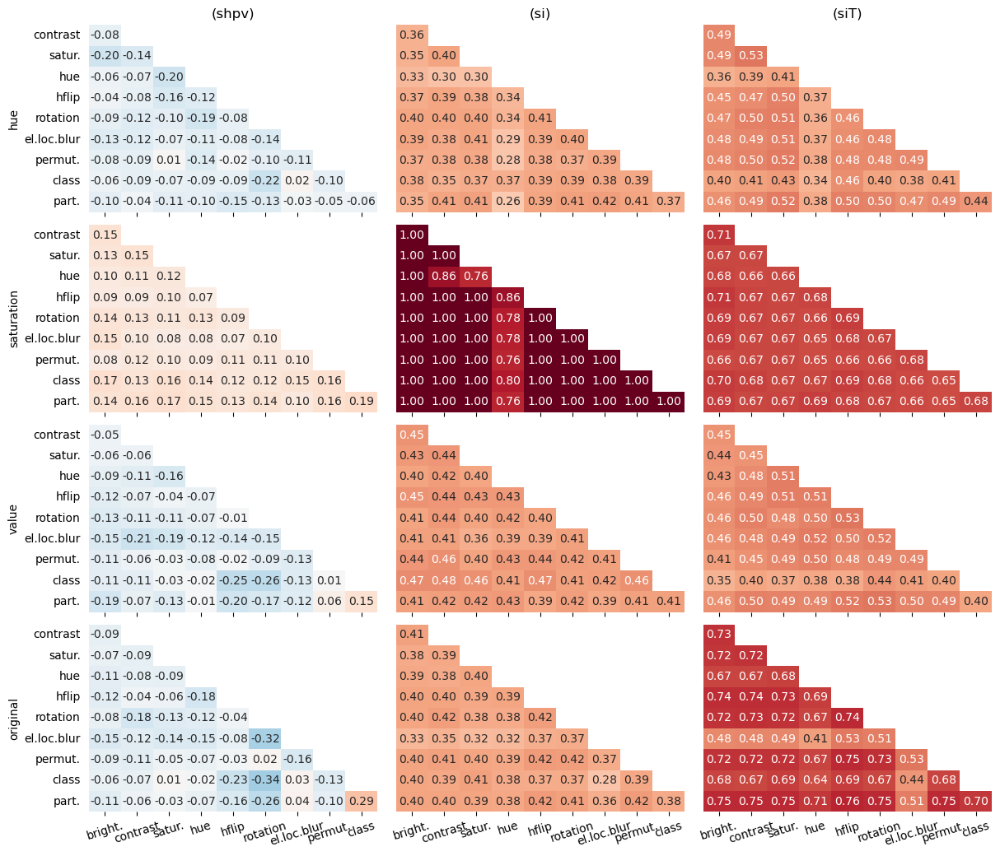


			layer2


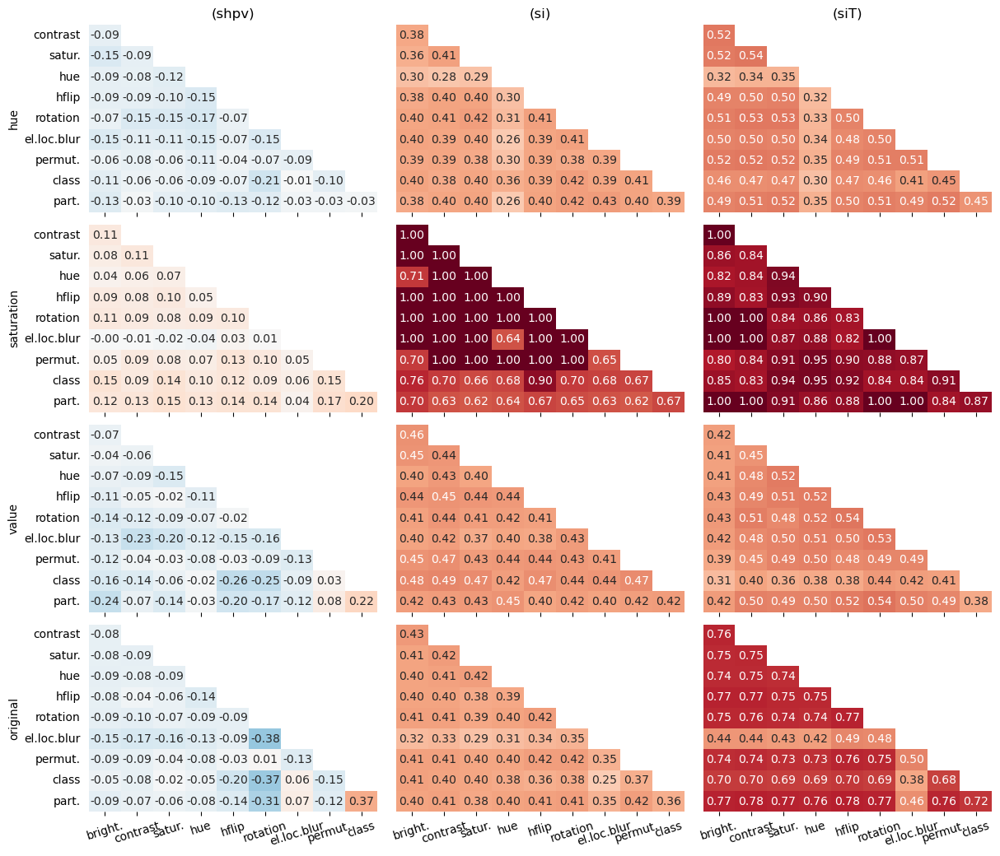


			layer3


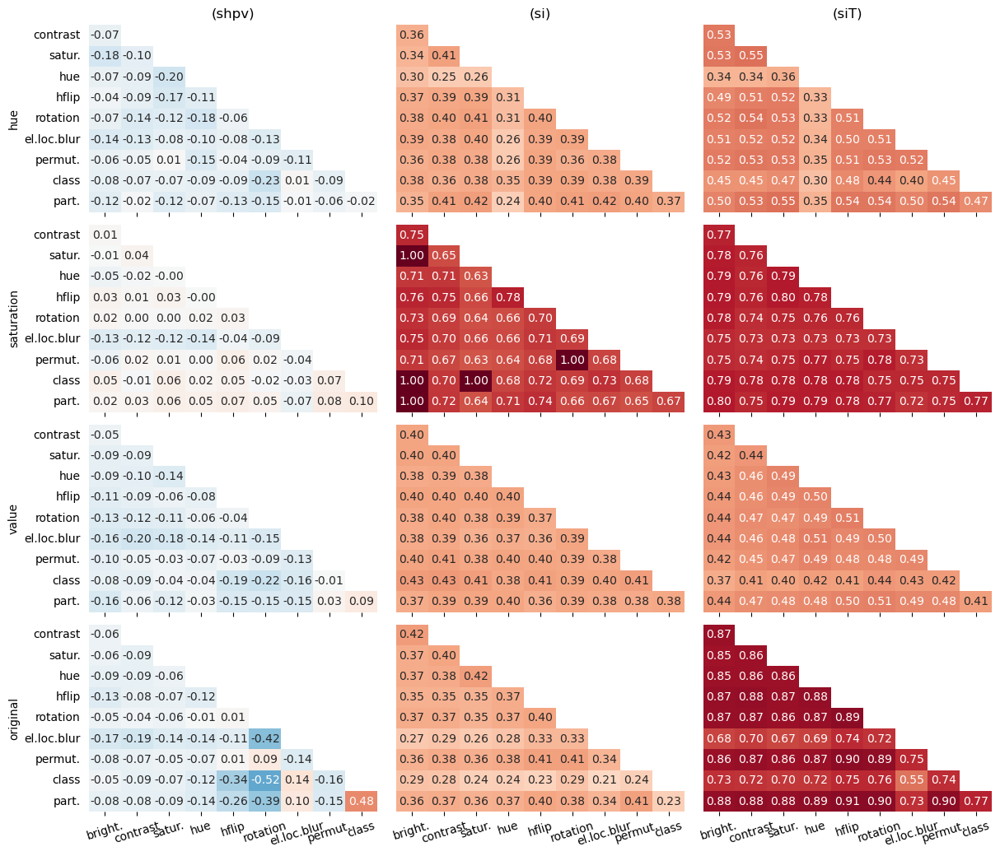

In [48]:
augmentation_set_number = 2

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{resnet18_network_name}_{dataset_name}/unit_mean_pixelwise_corpat/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'unit_mean_pixelwise_corpat_aug={augmentation_set_number}'


correlation.su_visualize.unit_mean_pixelwise_correlation_patterns(
    resnet18_mean_cormat_hsv_dict[augmentation_set_number],
    resnet18_mean_cormat_orig_dict[augmentation_set_number],
    resnet18_network_modules,
    augmentation_set_number,
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    cmap=cmap_uw_means_cm,
    figsize=figsize_uw_means_cm_2,
    show=show,
    no_chan_name=no_chan_name,
    save_dirname=save_dirname,
    save_filename_base=save_filename_base,
)

### 2.2.2 Consolidated summary plots

- [2.2.2.1 Augmentation set 1](#2.2.2.1-Augmentation-set-1)
- [2.2.2.2 Augmentation set 2](#2.2.2.2-Augmentation-set-2)

[[Back to subsection]](#2.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)

#### 2.2.3.1 Augmentation set 1

[[Return back]](#2.2.3-Consolidated-summary-plots)

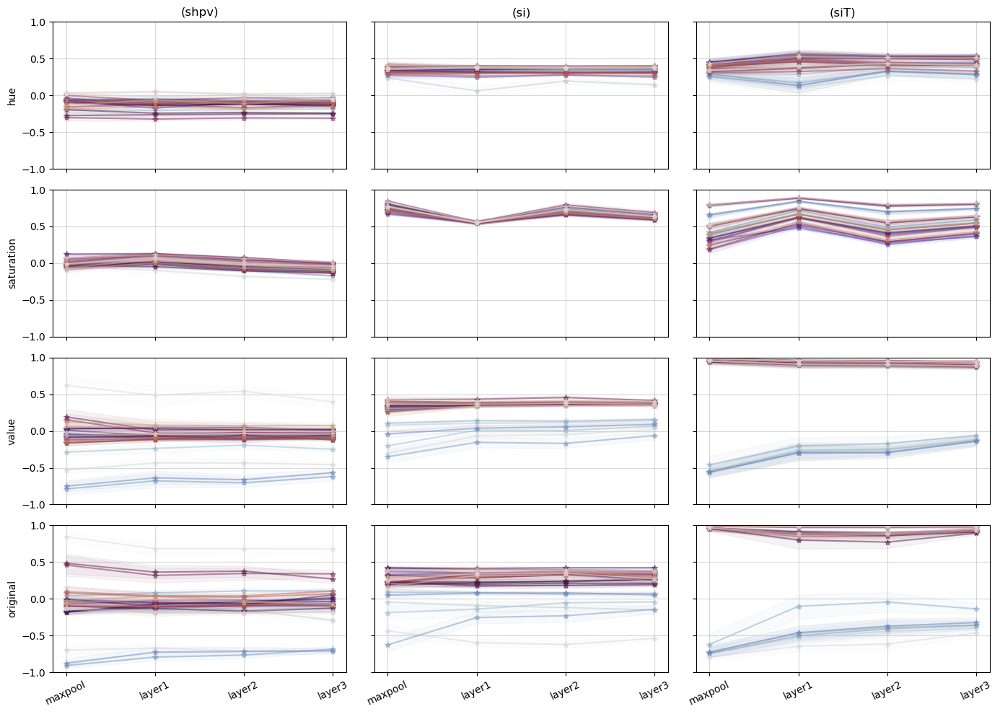

In [49]:
augmentation_set_number = 1

correlation.su_visualize.plot_consolidated_paired_correlations_fixed_values(
    resnet18_mean_cormat_hsv_dict[augmentation_set_number],
    resnet18_ci_lower_cormat_hsv_dict[augmentation_set_number],
    resnet18_ci_upper_cormat_hsv_dict[augmentation_set_number],
    resnet18_mean_cormat_orig_dict[augmentation_set_number],
    resnet18_ci_lower_cormat_orig_dict[augmentation_set_number],
    resnet18_ci_upper_cormat_orig_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    figsize=figsize_corr_consolidated,
    show=show,
    cmap=cmap_corr_consolidated,
    no_chan_name=no_chan_name,
)

#### 2.2.3.2 Augmentation set 2

[[Return back]](#2.2.3-Consolidated-summary-plots)

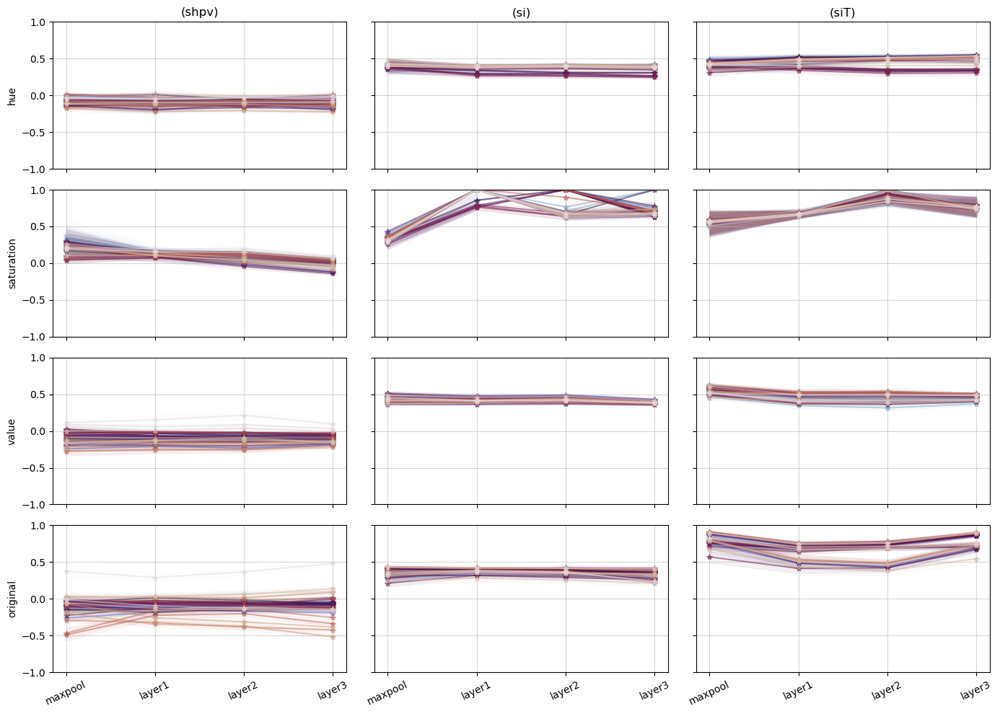

In [50]:
augmentation_set_number = 2

correlation.su_visualize.plot_consolidated_paired_correlations_fixed_values(
    resnet18_mean_cormat_hsv_dict[augmentation_set_number],
    resnet18_ci_lower_cormat_hsv_dict[augmentation_set_number],
    resnet18_ci_upper_cormat_hsv_dict[augmentation_set_number],
    resnet18_mean_cormat_orig_dict[augmentation_set_number],
    resnet18_ci_lower_cormat_orig_dict[augmentation_set_number],
    resnet18_ci_upper_cormat_orig_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    figsize=figsize_corr_consolidated,
    show=show,
    cmap=cmap_corr_consolidated,
    no_chan_name=no_chan_name,
)

### 2.2.3 Widths of confidence intervals

[[Back to subsection]](#2.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)

In [52]:
correlation.su_visualize.print_ci_interval_widths_cormat_hsv(
    resnet18_mean_cormat_hsv_dict,
    resnet18_ci_lower_cormat_hsv_dict,
    resnet18_ci_upper_cormat_hsv_dict,
    resnet18_network_modules,
    chans_name_list,
    value_name_list,
    augmentation_set_numbers_list,
    resnet18_n_conv_modules,
    extract_auxilliary_names=True
)

aug=1, maxpool, hue, shpv:  0.021821618 <= delta <= 0.088894950
aug=1, maxpool, hue, si:  0.108657092 <= delta <= 0.142203044
aug=1, maxpool, hue, siT:  0.085701183 <= delta <= 0.121673357
aug=1, maxpool, saturation, shpv:  0.034650934 <= delta <= 0.141588458
aug=1, maxpool, saturation, si:  0.010704553 <= delta <= 0.031039693
aug=1, maxpool, saturation, siT:  0.032670877 <= delta <= 0.107058935
aug=1, maxpool, value, shpv:  0.026933674 <= delta <= 0.236728275
aug=1, maxpool, value, si:  0.020987635 <= delta <= 0.161990207
aug=1, maxpool, value, siT:  0.016654820 <= delta <= 0.220507628
aug=1, layer1, hue, shpv:  0.010981208 <= delta <= 0.081506861
aug=1, layer1, hue, si:  0.021763456 <= delta <= 0.136180541
aug=1, layer1, hue, siT:  0.057946462 <= delta <= 0.207761523
aug=1, layer1, saturation, shpv:  0.025026523 <= delta <= 0.059727775
aug=1, layer1, saturation, si:  0.039500963 <= delta <= 0.046703461
aug=1, layer1, saturation, siT:  0.017764628 <= delta <= 0.048256710
aug=1, layer1

In [53]:
correlation.su_visualize.print_ci_interval_widths_cormat_orig(
    resnet18_mean_cormat_orig_dict,
    resnet18_ci_lower_cormat_orig_dict,
    resnet18_ci_upper_cormat_orig_dict,
    resnet18_network_modules,
    value_name_list,
    augmentation_set_numbers_list,
    resnet18_n_conv_modules,
    extract_auxilliary_names=True
)

aug=1, maxpool, original, shpv:  0.036939906 <= delta <= 0.278812580
aug=1, maxpool, original, si:  0.036578893 <= delta <= 0.229013659
aug=1, maxpool, original, siT:  0.005723400 <= delta <= 0.254185834
aug=1, layer1, original, shpv:  0.032476577 <= delta <= 0.198085315
aug=1, layer1, original, si:  0.018353381 <= delta <= 0.189168941
aug=1, layer1, original, siT:  0.008499883 <= delta <= 0.327151449
aug=1, layer2, original, shpv:  0.024371808 <= delta <= 0.168198036
aug=1, layer2, original, si:  0.016956784 <= delta <= 0.162548725
aug=1, layer2, original, siT:  0.009887600 <= delta <= 0.270662184
aug=1, layer3, original, shpv:  0.034690527 <= delta <= 0.111678029
aug=1, layer3, original, si:  0.025256978 <= delta <= 0.116679960
aug=1, layer3, original, siT:  0.003859327 <= delta <= 0.150426298
aug=2, maxpool, original, shpv:  0.038662189 <= delta <= 0.195033655
aug=2, maxpool, original, si:  0.024745864 <= delta <= 0.133983507
aug=2, maxpool, original, siT:  0.038287134 <= delta <= 0

### 2.3 Mean absolute differences between (space-wise) correlation matrices (original and cut submodule)

[[$\leftarrow$Prev.subsect.]](#2.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)$\quad$[[Back to section]](#2.-ResNet18)$\quad$[[Next subsect.$\to$]](#2.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)

- [2.3.1 Unit-wise means](#2.3.1-Unit-wise-means)
- [2.3.2 Consolidated summary plots](#2.3.2-Consolidated-summary-plots)
- [2.3.3 Widths of confidence intervals](#2.3.3-Widths-of-confidence-intervals)

### 2.3.1 Unit-wise means

- [2.3.1.1 Augmentation set 1](#2.3.1.2-Augmentation-set-1)
- [2.3.1.2 Augmentation set 2](#2.3.1.2-Augmentation-set-2)

[[Back to subsection]](#2.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))

#### 2.3.1.1 Augmentation set 1

[[Return back]](#2.3.1-Unit-wise-means)


			maxpool


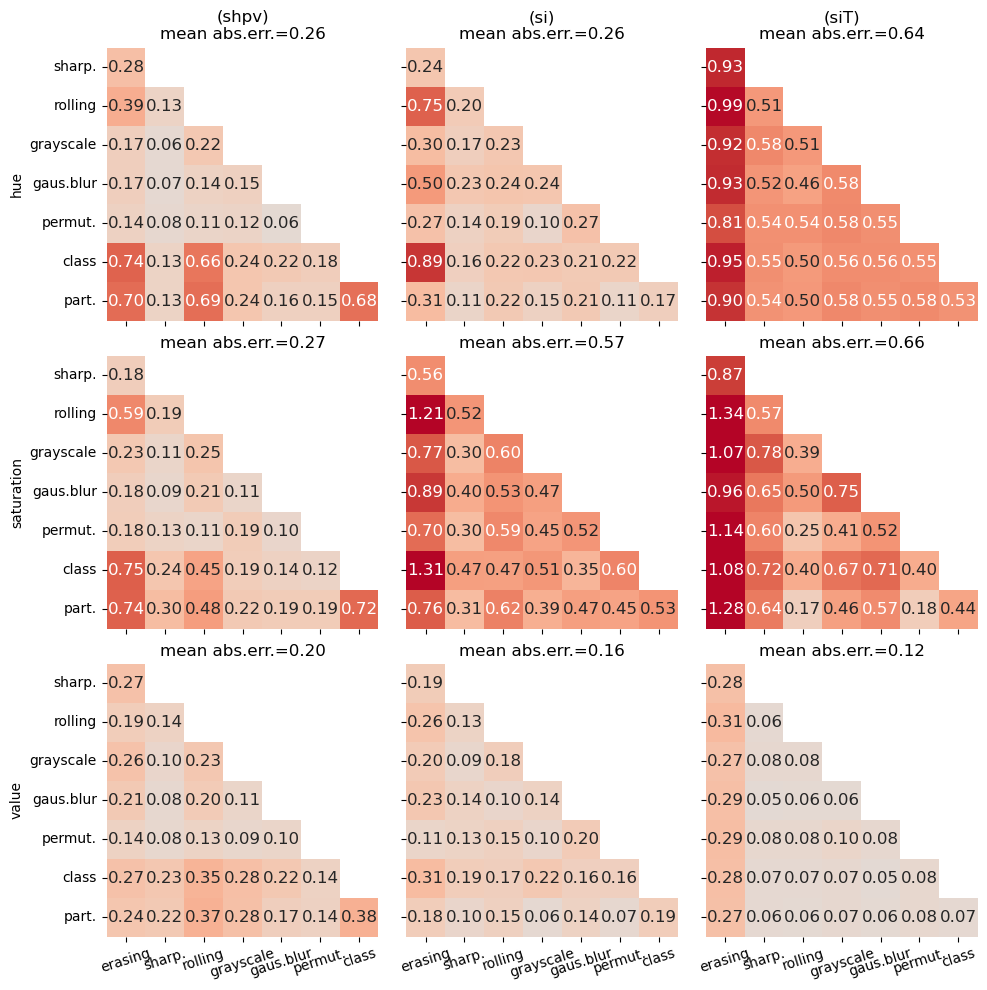


			layer1


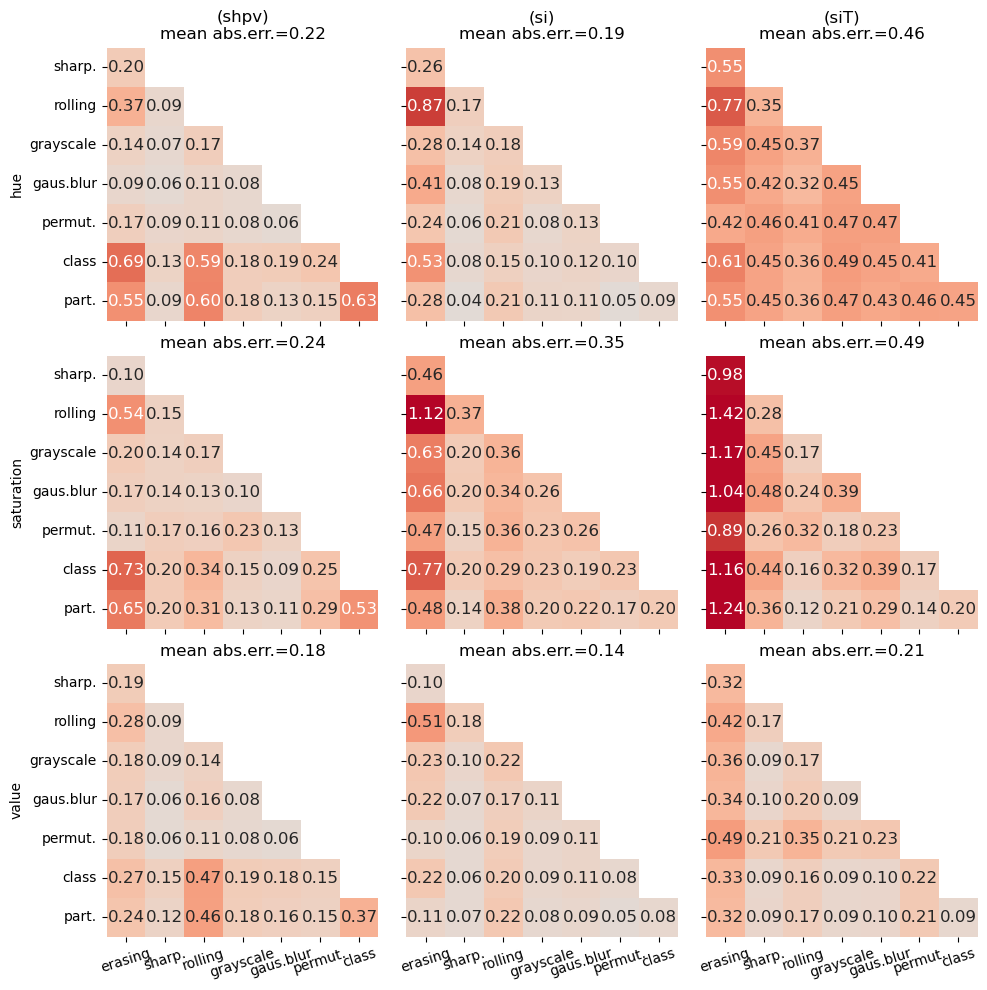


			layer2


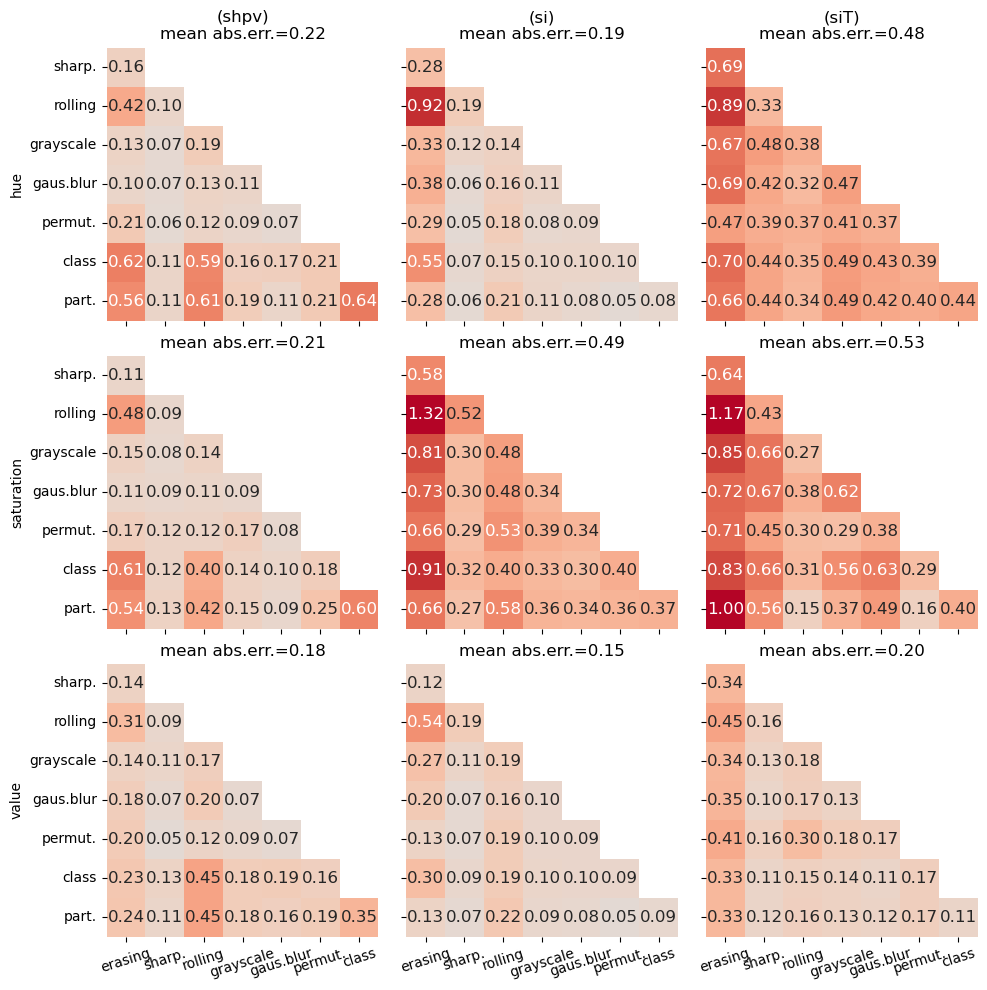


			layer3


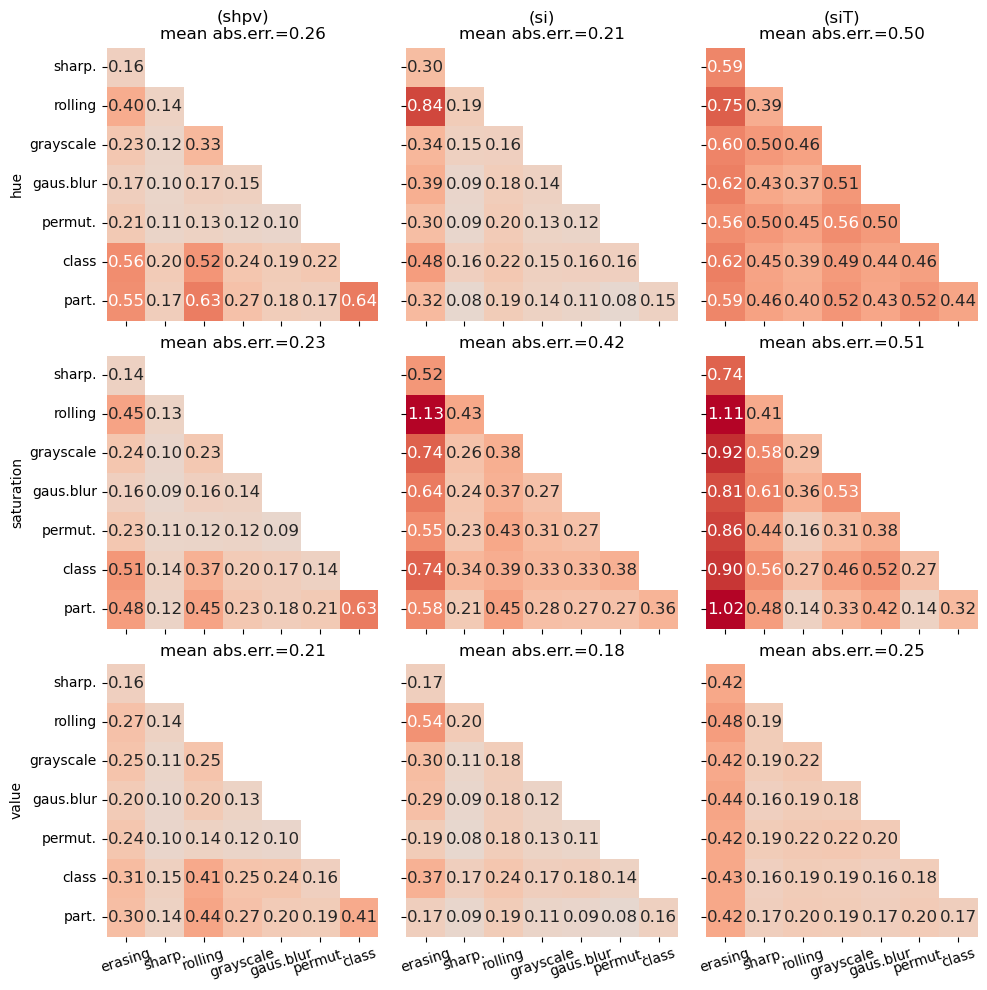

In [54]:
augmentation_set_number = 1

correlation.su_visualize.unit_mean_pixelwise_diff_correlation_patterns(
    resnet18_mean_cormat_diff[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    augmentation_set_number,
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    cmap=cmap_uw_means_diff_cm,
    figsize=figsize_uw_means_diff_cm_1,
    show=show,
)

#### 2.3.1.2 Augmentation set 2

[[Return back]](#2.3.1-Unit-wise-means)


			maxpool


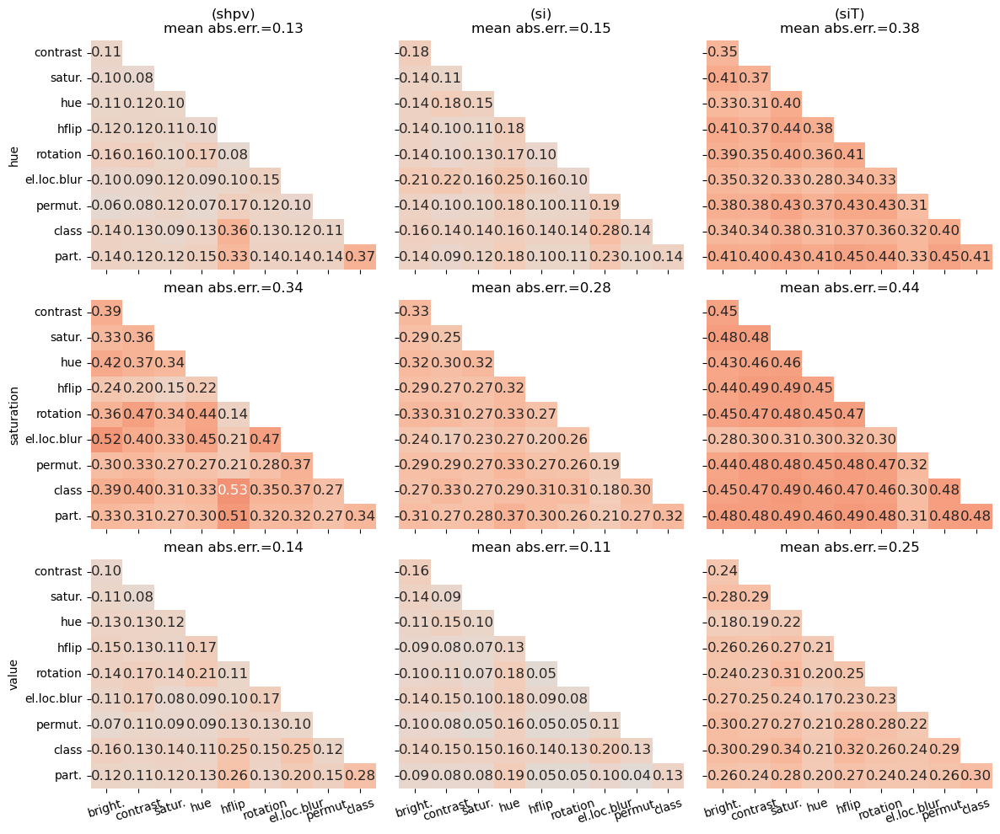


			layer1


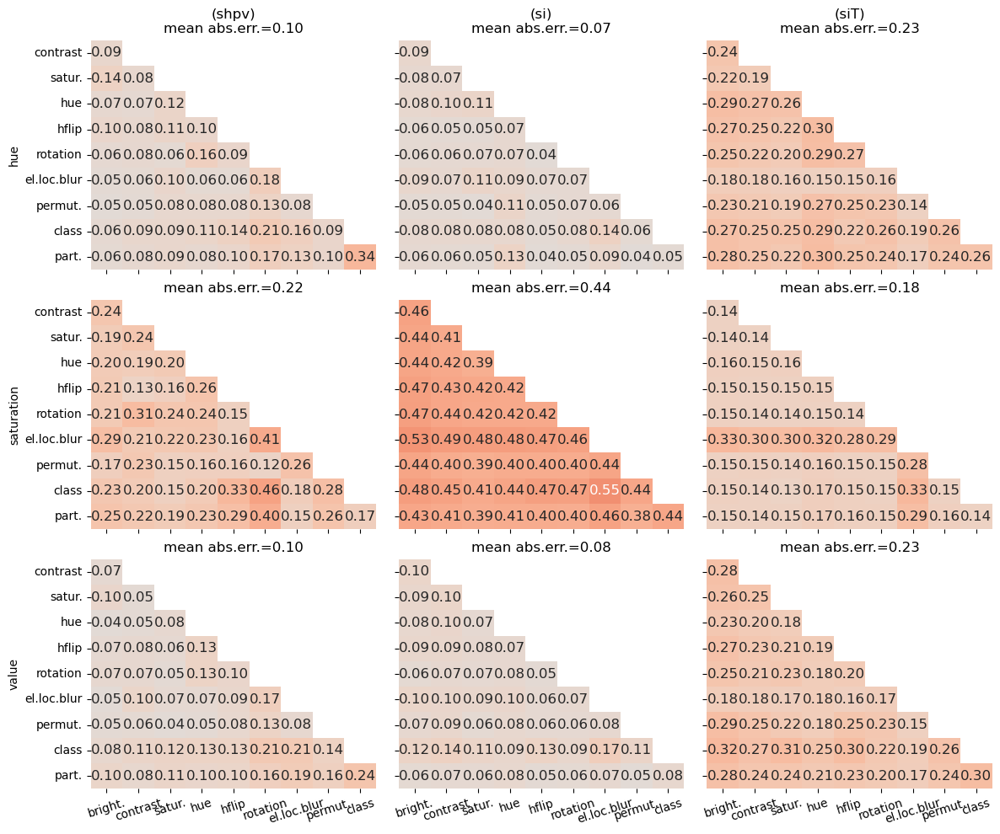


			layer2


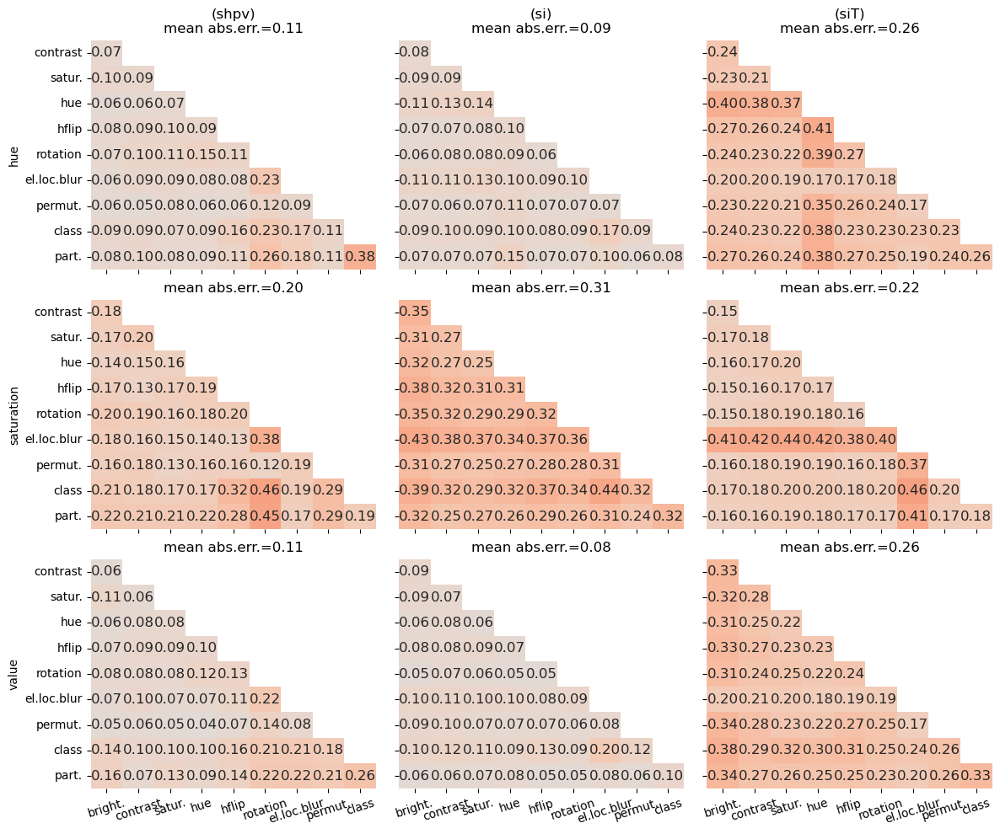


			layer3


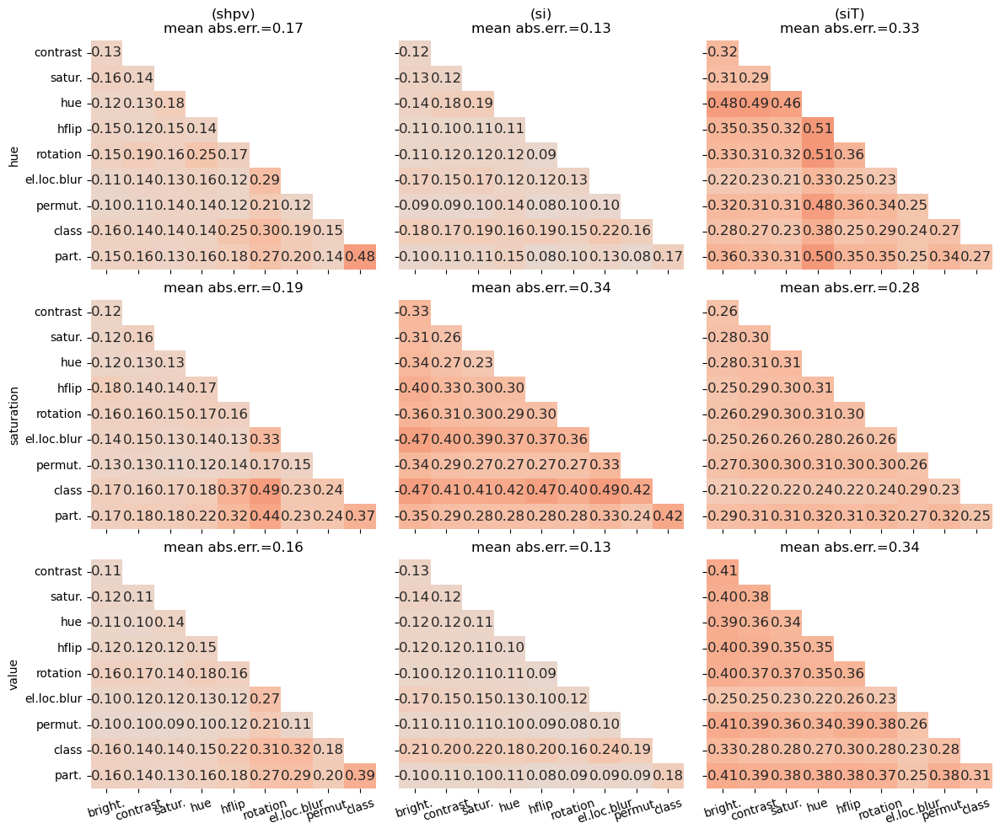

In [55]:
augmentation_set_number = 2

correlation.su_visualize.unit_mean_pixelwise_diff_correlation_patterns(
    resnet18_mean_cormat_diff[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    augmentation_set_number,
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    cmap=cmap_uw_means_diff_cm,
    figsize=figsize_uw_means_diff_cm_2,
    show=show,
)

### 2.3.2 Consolidated summary plots

- [2.3.2.1 Augmentation set 1](#2.3.2.1-Augmentation-set-1)
- [2.3.2.2 Augmentation set 2](#2.3.2.2-Augmentation-set-2)

[[Back to subsection]](#2.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))

#### 2.3.2.1 Augmentation set 1

[[Return back]](#2.3.2-Consolidated-summary-plots)

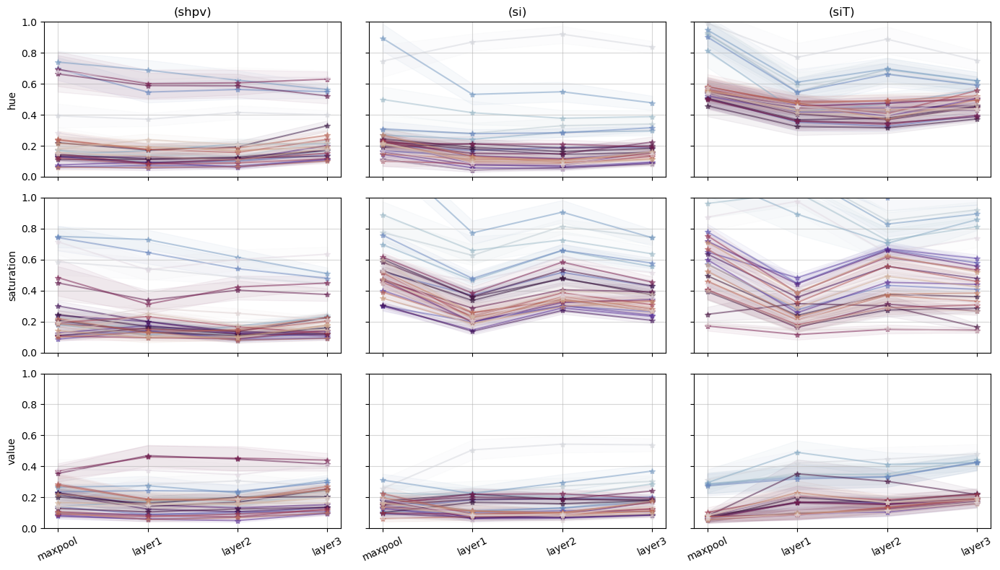

In [56]:
augmentation_set_number = 1

correlation.su_visualize.plot_consolidated_paired_correlations_fixed_values(
    resnet18_mean_cormat_diff[augmentation_set_number],
    resnet18_ci_lower_cormat_diff[augmentation_set_number],
    resnet18_ci_upper_cormat_diff[augmentation_set_number],
    None,
    None,
    None,
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    show=show,
    figsize=figsize_corr_consolidated_diff,
    cmap=cmap_corr_consolidated,
    no_chan_name=no_chan_name,
    vmin=0,
)

#### 2.3.3.2 Augmentation set 2

[[Return back]](#2.3.3-Consolidated-summary-plots)

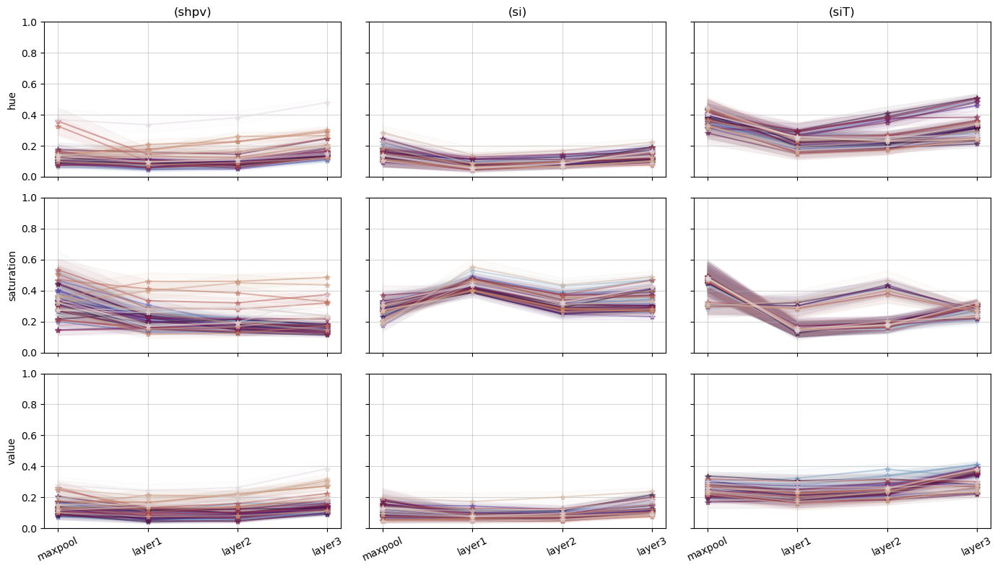

In [57]:
augmentation_set_number = 2

correlation.su_visualize.plot_consolidated_paired_correlations_fixed_values(
    resnet18_mean_cormat_diff[augmentation_set_number],
    resnet18_ci_lower_cormat_diff[augmentation_set_number],
    resnet18_ci_upper_cormat_diff[augmentation_set_number],
    None,
    None,
    None,
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    show=show,
    figsize=figsize_corr_consolidated_diff,
    cmap=cmap_corr_consolidated,
    no_chan_name=no_chan_name,
    vmin=0,
)

### 2.3.3 Widths of confidence intervals

[[Back to subsection]](#2.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))

In [58]:
correlation.su_visualize.print_ci_interval_widths_cormat_diff(
    resnet18_mean_cormat_diff,
    resnet18_ci_lower_cormat_diff,
    resnet18_ci_upper_cormat_diff,
    resnet18_network_modules,
    chans_name_list,
    value_name_list,
    augmentation_set_numbers_list,
    resnet18_n_conv_modules,
    extract_auxilliary_names=True
)

aug=1, maxpool, hue, shpv:  0.026255375 <= delta <= 0.236344451
aug=1, maxpool, hue, si:  0.063511044 <= delta <= 0.207053584
aug=1, maxpool, hue, siT:  0.113703986 <= delta <= 0.223014171
aug=1, maxpool, saturation, shpv:  0.000000000 <= delta <= 0.238101008
aug=1, maxpool, saturation, si:  0.000000000 <= delta <= 0.190388076
aug=1, maxpool, saturation, siT:  0.000000000 <= delta <= 0.249640323
aug=1, maxpool, value, shpv:  0.000000000 <= delta <= 0.159780071
aug=1, maxpool, value, si:  0.000000000 <= delta <= 0.140497928
aug=1, maxpool, value, siT:  0.000000000 <= delta <= 0.150170064
aug=1, layer1, hue, shpv:  0.000000000 <= delta <= 0.184837602
aug=1, layer1, hue, si:  0.000000000 <= delta <= 0.151002003
aug=1, layer1, hue, siT:  0.000000000 <= delta <= 0.195591404
aug=1, layer1, saturation, shpv:  0.000000000 <= delta <= 0.142353626
aug=1, layer1, saturation, si:  0.000000000 <= delta <= 0.168972488
aug=1, layer1, saturation, siT:  0.000000000 <= delta <= 0.274820667
aug=1, layer1

### 2.4 Mean absolute norm between (space-wise) correlation matrices for pairs of layers

[[$\leftarrow$Prev.subsect.]](#2.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))$\quad$[[Back to section]](#2.-ResNet18)$\quad$[[Next subsect.$\to$]](#2.5-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)

- [2.4.1 Augmentation set 1](#2.4.1-Augmentation-set-1)
- [2.4.2 Augmentation set 2](#2.4.2-Augmentation-set-2)
- [2.4.3 Widths of confidence intervals](#2.4.3-Widths-of-confidence-intervals)

#### 2.4.1 Augmentation set 1

[[Return back]](#2.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)

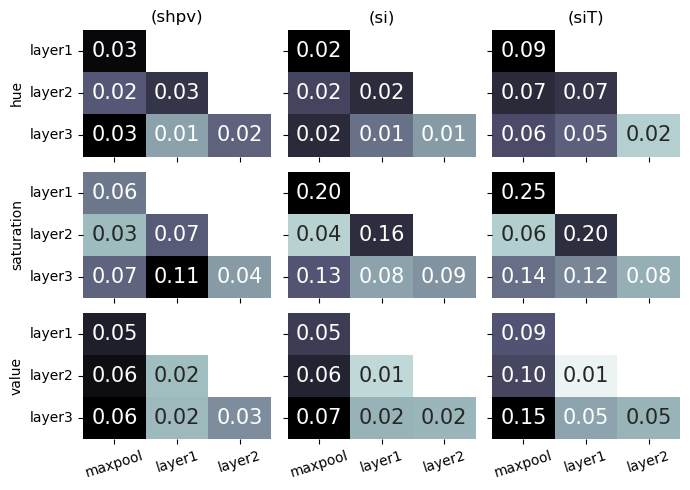

In [59]:
augmentation_set_number = 1

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{resnet18_network_name}_{dataset_name}/hsv_diff_patterns_among_checkpoints/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'resnet18_hsv_diff_patterns_among_chkpts'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    resnet18_cm_mean_hsv_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
    cmap=cmap_unit_cm_patterns,
    figsize=figsize_unit_cm_patterns,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    text_size=15
)

#### 2.4.2 Augmentation set 2

[[Return back]](#2.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)

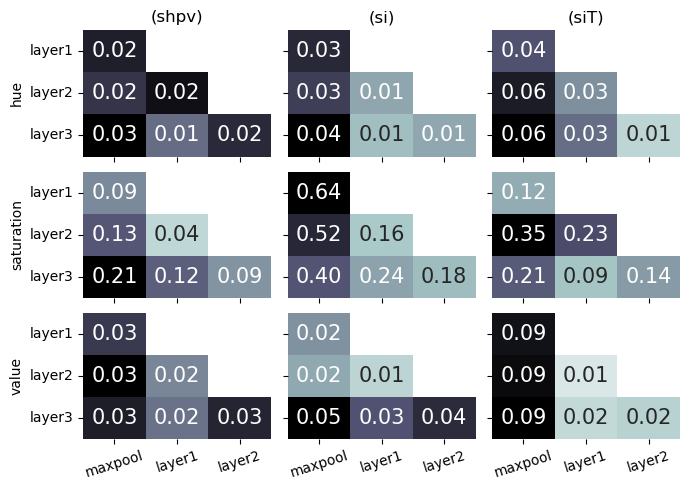

In [60]:
augmentation_set_number = 2

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{resnet18_network_name}_{dataset_name}/hsv_diff_patterns_among_checkpoints/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'resnet18_hsv_diff_patterns_among_chkpts'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    resnet18_cm_mean_hsv_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
    cmap=cmap_unit_cm_patterns,
    figsize=figsize_unit_cm_patterns,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    text_size=15
)

#### 2.4.3 Widths of confidence intervals

[[Return back]](#2.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)

In [62]:
correlation.su_visualize.print_ci_interval_widths_cormat_diff2(
    resnet18_cm_mean_hsv_diff_dict,
    resnet18_cm_ci_lower_hsv_diff_dict,
    resnet18_cm_ci_upper_hsv_diff_dict,
    resnet18_network_modules,
    chans_name_list,
    value_name_list,
    augmentation_set_numbers_list,
    resnet18_n_conv_modules,
    extract_auxilliary_names=True
)

aug=1, maxpool--layer1, hue, shpv:  delta=0.018
aug=1, maxpool--layer1, hue, si:  delta=0.022
aug=1, maxpool--layer1, hue, siT:  delta=0.031
aug=1, maxpool--layer1, saturation, shpv:  delta=0.022
aug=1, maxpool--layer1, saturation, si:  delta=0.029
aug=1, maxpool--layer1, saturation, siT:  delta=0.054
aug=1, maxpool--layer1, value, shpv:  delta=0.038
aug=1, maxpool--layer1, value, si:  delta=0.048
aug=1, maxpool--layer1, value, siT:  delta=0.074
aug=1, maxpool--layer2, hue, shpv:  delta=0.011
aug=1, maxpool--layer2, hue, si:  delta=0.008
aug=1, maxpool--layer2, hue, siT:  delta=0.020
aug=1, maxpool--layer2, saturation, shpv:  delta=0.023
aug=1, maxpool--layer2, saturation, si:  delta=0.009
aug=1, maxpool--layer2, saturation, siT:  delta=0.017
aug=1, maxpool--layer2, value, shpv:  delta=0.034
aug=1, maxpool--layer2, value, si:  delta=0.046
aug=1, maxpool--layer2, value, siT:  delta=0.078
aug=1, layer1--layer2, hue, shpv:  delta=0.012
aug=1, layer1--layer2, hue, si:  delta=0.017
aug=1, l

### 2.5 Correlation patterns extracted from correlation matrices for paired layers

[[$\leftarrow$Prev.subsect.]](#2.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)$\quad$[[Back to section]](#2.-ResNet18)$\quad$[[Next subsect.$\to$]](#2.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)

- [2.5.1 Augmentation set 1](#2.5.1-Augmentation-set-1)
- [2.5.2 Augmentation set 2](#2.5.2-Augmentation-set-2)

#### 2.5.1 Augmentation set 1

[[Back to subsection]](#2.5-Correlation-patterns-extracted-from-correlation-matrices-for-paired-layers)

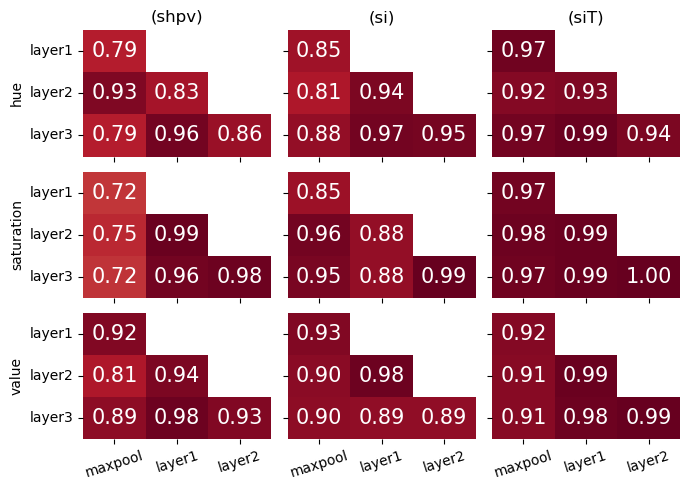

In [63]:
augmentation_set_number = 1

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{resnet18_network_name}_{dataset_name}/hsv_diff_patterns_among_checkpoints_corr/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'resnet18_hsv_diff_patterns_among_chkpts_corr'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    resnet18_cm_corr_hsv_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
    #cmap='Spectral_r',
    cmap='RdGy_r',
    figsize=figsize_unit_cm_patterns,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    cmap_bounds=(-1, 1),
    cormat_nanmask=resnet18_cm_corr_hsv_diff_nanmask_dict[augmentation_set_number],
    text_size=15
)

#### 2.5.2 Augmentation set 2

[[Back to subsection]](#2.5-Correlation-patterns-extracted-from-correlation-matrices-for-paired-layers)

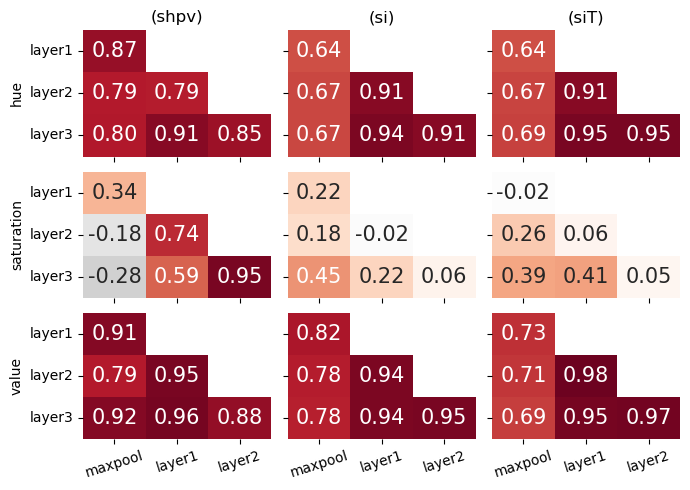

In [64]:
augmentation_set_number = 2

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{resnet18_network_name}_{dataset_name}/hsv_diff_patterns_among_checkpoints_corr/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'resnet18_hsv_diff_patterns_among_chkpts_corr'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    resnet18_cm_corr_hsv_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
    #cmap='Spectral_r',
    cmap='RdGy_r',
    figsize=figsize_unit_cm_patterns,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    cmap_bounds=(-1, 1),
    cormat_nanmask=resnet18_cm_corr_hsv_diff_nanmask_dict[augmentation_set_number],
    text_size=15
)

### 2.6 Mean absolute norm between (space-wise) original-channel differences of correlation matrices for pairs of layers

[[$\leftarrow$Prev.subsect.]](#2.5-Correlation-patterns-extracted-from-correlation-matrices-for-paired-layers)$\quad$[[Back to section]](#2.-ResNet18)$\quad$[[Next subsect.$\to$]](#2.7-Correlation-patterns-extracted-from-original-channel-correlation-matrices-for-paired-layers)

- [2.6.1 Augmentation set 1](#2.6.1-Augmentation-set-1)
- [2.6.2 Augmentation set 2](#2.6.2-Augmentation-set-2)
- [2.6.3 Widths of confidence intervals](#2.6.3-Widths-of-confidence-intervals)

### 2.6.1 Augmentation set 1

[[Return back]](#2.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)

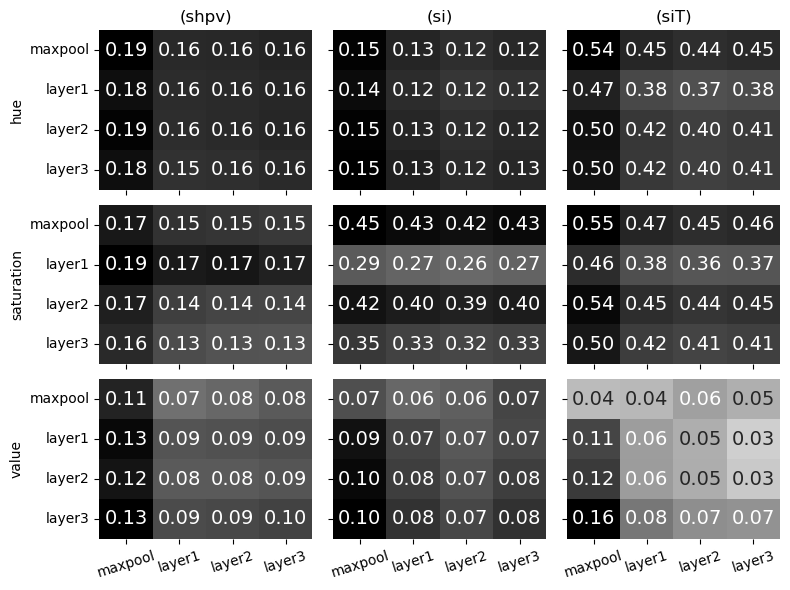

In [65]:
augmentation_set_number = 1

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{resnet18_network_name}_{dataset_name}/hsv_diff_patterns_with_orig/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'resnet18_hsv_diff_patterns_with_orig'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    resnet18_cm_mean_hsv_orig_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
    cmap=cmap_uw_means_diff_cm_norm_orig_chan,
    figsize=figsize_uw_means_diff_cm_norm_orig_chan,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    text_size=14
)

### 2.6.2 Augmentation set 2

[[Return back]](#2.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)

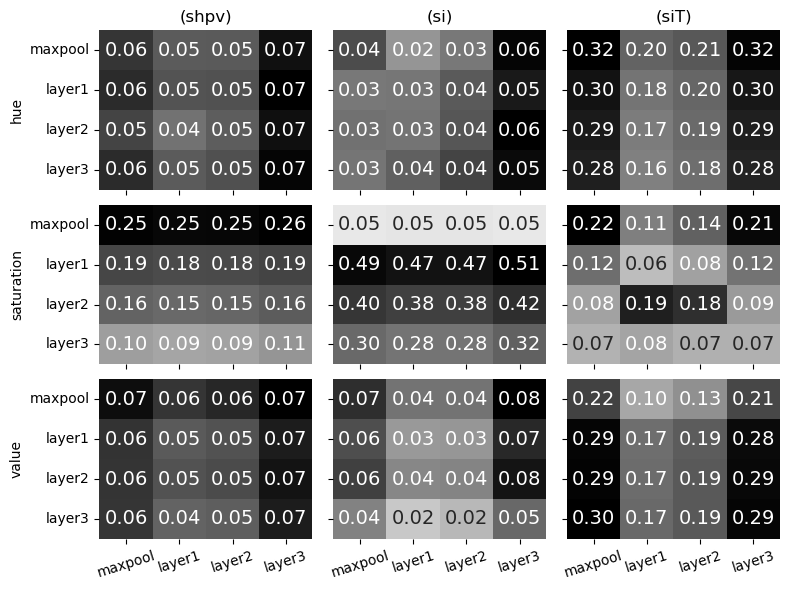

In [66]:
augmentation_set_number = 2

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{resnet18_network_name}_{dataset_name}/hsv_diff_patterns_with_orig/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'resnet18_hsv_diff_patterns_with_orig'

correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    resnet18_cm_mean_hsv_orig_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
    cmap=cmap_uw_means_diff_cm_norm_orig_chan,
    figsize=figsize_uw_means_diff_cm_norm_orig_chan,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    text_size=14
)

### 2.6.3 Widths of confidence intervals

[[Return back]](#2.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)

In [67]:
correlation.su_visualize.print_ci_interval_widths_cm_hsv_diff(
    resnet18_cm_mean_hsv_orig_diff_dict,
    resnet18_cm_ci_lower_hsv_orig_diff_dict,
    resnet18_cm_ci_upper_hsv_orig_diff_dict,
    resnet18_network_modules,
    chans_name_list,
    value_name_list,
    augmentation_set_numbers_list,
    resnet18_n_conv_modules,
    extract_auxilliary_names=True
)

aug=1, maxpool--maxpool, hue, shpv:  delta=0.167
aug=1, maxpool--maxpool, hue, si:  delta=0.137
aug=1, maxpool--maxpool, hue, siT:  delta=0.219
aug=1, maxpool--maxpool, saturation, shpv:  delta=0.160
aug=1, maxpool--maxpool, saturation, si:  delta=0.219
aug=1, maxpool--maxpool, saturation, siT:  delta=0.261
aug=1, maxpool--maxpool, value, shpv:  delta=0.065
aug=1, maxpool--maxpool, value, si:  delta=0.045
aug=1, maxpool--maxpool, value, siT:  delta=0.044
aug=1, maxpool--layer1, hue, shpv:  delta=0.136
aug=1, maxpool--layer1, hue, si:  delta=0.121
aug=1, maxpool--layer1, hue, siT:  delta=0.172
aug=1, maxpool--layer1, saturation, shpv:  delta=0.136
aug=1, maxpool--layer1, saturation, si:  delta=0.206
aug=1, maxpool--layer1, saturation, siT:  delta=0.230
aug=1, maxpool--layer1, value, shpv:  delta=0.042
aug=1, maxpool--layer1, value, si:  delta=0.041
aug=1, maxpool--layer1, value, siT:  delta=0.042
aug=1, maxpool--layer2, hue, shpv:  delta=0.139
aug=1, maxpool--layer2, hue, si:  delta=0.1

### 2.7 Correlation patterns extracted from original-channel correlation matrices for paired layers

[[$\leftarrow$Prev.subsect.]](#2.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)$\quad$[[Back to section]](#2.-ResNet18)$\quad$

- [2.7.1 Augmentation set 1](#2.7.1-Augmentation-set-1)
- [2.7.2 Augmentation set 2](#2.7.2-Augmentation-set-2)

#### 2.7.1 Augmentation set 1


[[Back to subsection]](#2.7-Correlation-patterns-extracted-from-original-channel-correlation-matrices-for-paired-layers)

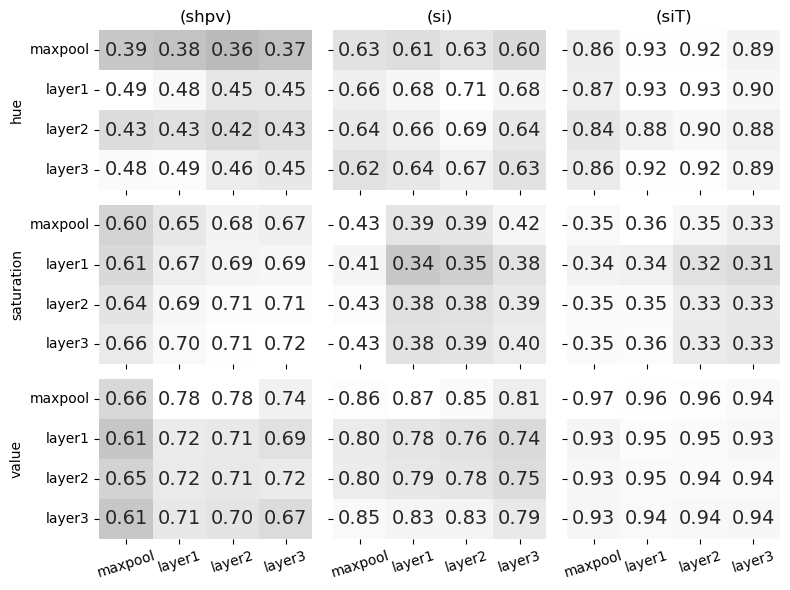

In [68]:
augmentation_set_number = 1

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{resnet18_network_name}_{dataset_name}/hsv_diff_patterns_with_orig_corr/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'resnet18_hsv_diff_patterns_with_orig_corr'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    resnet18_cm_corr_hsv_orig_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
    cmap='gist_yarg_r',
    figsize=figsize_uw_means_diff_cm_norm_orig_chan,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    #cmap_bounds=(-1, 1),
    cormat_nanmask=resnet18_cm_corr_hsv_orig_diff_nanmask_dict[augmentation_set_number],
    text_size=14
)

#### 2.7.2 Augmentation set 2


[[Back to subsection]](#2.7-Correlation-patterns-extracted-from-original-channel-correlation-matrices-for-paired-layers)

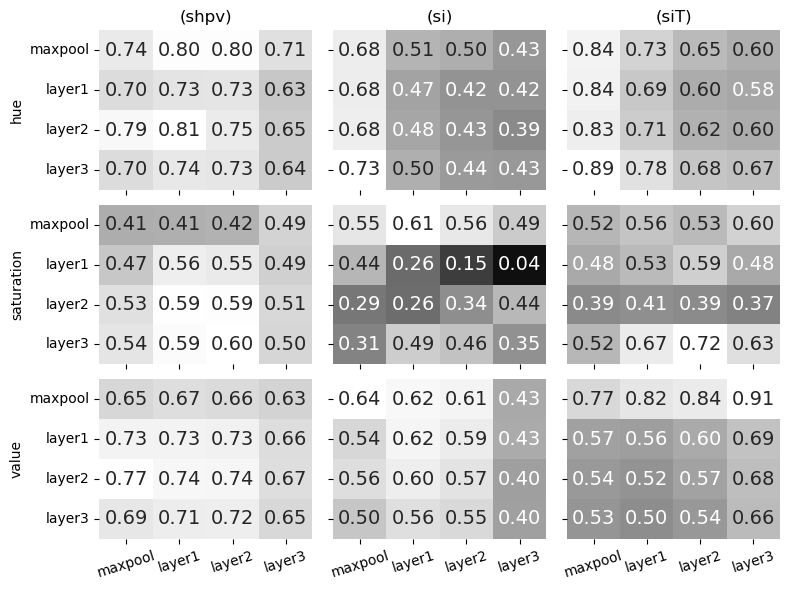

In [69]:
augmentation_set_number = 2

save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{resnet18_network_name}_{dataset_name}/hsv_diff_patterns_with_orig_corr/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'resnet18_hsv_diff_patterns_with_orig_corr'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    resnet18_cm_corr_hsv_orig_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
    cmap='gist_yarg_r',
    figsize=figsize_uw_means_diff_cm_norm_orig_chan,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    #cmap_bounds=(-1, 1),
    cormat_nanmask=resnet18_cm_corr_hsv_orig_diff_nanmask_dict[augmentation_set_number],
    text_size=14
)